# 0. Introduction

This **Jupyter** notebook runs on a **Python 2** kernel. 

Cells that start with ```%%R``` are pure **R**. Cells that start with ```%%bash``` are pure **bash** code.

With ```%Rpush X``` we can push a variable, in this case ```X``` from *python* to *R* and with ```%Rpull X```, pull a variable from *R* to *python*.

A minimal introduction to programming can be gain at [codeacademy](https://www.codeacademy.com), more precisely, command line introduction [learn-the-command-line](https://www.codecademy.com/courses/learn-the-command-line) and [Python](https://www.codecademy.com/learn/python).

Nonetheless, readers should be able to understand variables, that everything typed after a ```#``` is a comment and not part of the code, and that everything between quotes is a string eg. ```"This is a string"```.

Users should not hesitate to add new cells and print out the contents of a variable eg. 

```python
eCLIP_1_bednarrowPeak="https://www.encodeproject.org/files/ENCFF066PCT/@@download/ENCFF066PCT.bed.gz"
print eCLIP_1_bednarrowPeak
```

or in the case of lists,

```python
listA=[1,23,34,11,6,8,3,3,2,90,223,2,44,5,78]
print listA[:10]
```

to print the first 10 elements of the list, listA.

Or as in the case of Pandas DataFrames,

```python 
print dataframeX.head()
```

to print the first 5 lines / head of the DataFrame, dataframeX.

In [1]:
from datetime import datetime
print datetime.now()

2016-10-29 11:58:13.060242


# 1.  Downloading raw data, reference genome, and reference annotation

Having identified KHSRP as a molecule of interest in [ENCODE](https://www.encodeproject.org) we start by [downloading](https://www.encodeproject.org/experiments/ENCSR561CBC/) the files for the knock-down of KHSRP in the human cell line K562. The association graph in encode shows 2 replicates for which transcript and gene quantifications are already available. We collect these files for further analysis. It is important to make sure that all downloaded data which is already processed has the same reference genome and annotation. In this case, we use the GRCh38 v24 reference.

Equally, the controls shown in the summary section are downloaded from [here](https://www.encodeproject.org/experiments/ENCSR561CBC/).

Reference fasta and GTF files for different releases are available at [gencodegenes.org](https://www.gencodegenes.org/releases/).

The following step downloads all files required for differential gene expression analysis on our samples of choice:

In [2]:
%%bash 
# this makes this cell work in bash

echo "Downloading results"

# We start by creating the required folders
mkdir -p ~/work/results/rsem-results/raw_data
# Change directory into the newly created folder
cd ~/work/results/rsem-results/raw_data

# Download files with wget
wget -q https://www.encodeproject.org/files/ENCFF223LJT/@@download/ENCFF223LJT.tsv -O control.genes.results
wget -q https://www.encodeproject.org/files/ENCFF143CKD/@@download/ENCFF143CKD.tsv -O control.isoforms.results
wget -q https://www.encodeproject.org/files/ENCFF089HPB/@@download/ENCFF089HPB.tsv -O control_2.genes.results
wget -q https://www.encodeproject.org/files/ENCFF338VEF/@@download/ENCFF338VEF.tsv -O control_2.isoforms.results

wget -q https://www.encodeproject.org/files/ENCFF883SCU/@@download/ENCFF883SCU.tsv -O shRNA.genes.results
wget -q https://www.encodeproject.org/files/ENCFF959TXA/@@download/ENCFF959TXA.tsv -O shRNA.isoforms.results
wget -q https://www.encodeproject.org/files/ENCFF439UJR/@@download/ENCFF439UJR.tsv -O shRNA_2.genes.results
wget -q https://www.encodeproject.org/files/ENCFF607QXQ/@@download/ENCFF607QXQ.tsv -O shRNA_2.isoforms.results

# Change directory to one level bellow
cd ../
wget -q ftp://ftp.sanger.ac.uk/pub/gencode/Gencode_human/release_24/gencode.v24.primary_assembly.annotation.gtf.gz -O annotation.gtf.gz 
wget -q ftp://ftp.sanger.ac.uk/pub/gencode/Gencode_human/release_24/GRCh38.primary_assembly.genome.fa.gz -O genome.fa.gz

# Unzip the downloaded reference files
unpigz annotation.gtf.gz
unpigz genome.fa.gz

In [3]:
print datetime.now()

2016-10-29 12:03:52.155047


# 2. Differential gene expression (DGE)

In ENCODE, by selecting the different analysis steps on the association graph we are shown which analysis pipeline has been used for the processing of the data - 'Long RNA-seq RSEM quantification step for paired-end pipeline'.
RSEM is a software package for estimating gene and isoform expression levels from RNA-Seq data. RSEM comes with the downstream tool EBseq which can be used for differential gene expression analysis.

In bash, we can check how a program works by doing eg. 

```rsem-run-ebseq --help```

We follow the instructions and generate differential gene expression tables from the data downloaded from encode.

In [4]:
%%bash

cd ~/work/results/rsem-results/raw_data

echo "Analysing gene expression data"

rsem-generate-data-matrix shRNA.genes.results shRNA_2.genes.results control.genes.results control_2.genes.results > ../GeneMat.txt
cd ..
rsem-run-ebseq GeneMat.txt 2,2 GeneMat.results
rsem-control-fdr GeneMat.results 0.05 GeneMat.de.txt

echo "Analysing transcripts data"

cd raw_data 
rsem-generate-data-matrix shRNA.isoforms.results shRNA_2.isoforms.results control.isoforms.results control_2.isoforms.results > ../IsoformsMat.txt
cd ..
rsem-prepare-reference --gtf annotation.gtf genome.fa genome
rsem-generate-ngvector genome.transcripts.fa genome

# With the next comand we collect the 1st line of the file IsoformsMat.txt 
# and redirect the output of that to IsoformsMat_b.txt  
head -n 1 IsoformsMat.txt > IsoformsMat_b.txt  

# We then read the IsoformsMat.txt and grab everyle line that contains the
# text ENST for collecting ENSEMBL transcripts
cat IsoformsMat.txt | grep ENST >> IsoformsMat_b.txt

rsem-run-ebseq --ngvector genome.ngvec IsoformsMat_b.txt 2,2 IsoformsMat.results
rsem-control-fdr IsoformsMat.results 0.05 IsoformsMat.de.txt

Analysing gene expression data
rsem-for-ebseq-find-DE /home/jovyan/software/RSEM-1.3.0/EBSeq # GeneMat.txt GeneMat.results 2 2
Removing transcripts with 75 th quantile < = 10 
14379 transcripts will be tested

There are 616 genes/transcripts reported at FDR = 0.05.
Analysing transcripts data
rsem-extract-reference-transcripts genome 0 annotation.gtf None 0 genome.fa
Parsed 200000 lines
Parsed 400000 lines
Parsed 600000 lines
Parsed 800000 lines
Parsed 1000000 lines
Parsed 1200000 lines
Parsed 1400000 lines
Parsed 1600000 lines
Parsed 1800000 lines
Parsed 2000000 lines
Parsed 2200000 lines
Parsed 2400000 lines
Parsing gtf File is done!
genome.fa is processed!
199348 transcripts are extracted.
Extracting sequences is done!
Group File is generated!
Transcript Information File is generated!
Chromosome List File is generated!
Extracted Sequences File is generated!

rsem-preref genome.transcripts.fa 1 genome
Refs.makeRefs finished!
Refs.saveRefs finished!
genome.idx.fa is generated!
genome.n

Loading required package: blockmodeling
Loading required package: gplots

Attaching package: ‘gplots’

The following object is masked from ‘package:stats’:

    lowess

iteration 1 done 

time 4.78 

iteration 2 done 

time 2.53 

iteration 3 done 

time 2.52 

iteration 4 done 

time 2.45 

iteration 5 done 

time 2.34 

Loading required package: blockmodeling
Loading required package: gplots

Attaching package: ‘gplots’

The following object is masked from ‘package:stats’:

    lowess

iteration 1 done 

time 68.14 

iteration 2 done 

time 27.21 

iteration 3 done 

time 25.25 

iteration 4 done 

time 30.53 

iteration 5 done 

time 21.07 



In [5]:
print datetime.now()

2016-10-29 12:38:50.542606


# 3. Parsing annotation file 

As you will soon see, the annotation.gtf file contains valuable information. It is therefore practical to have it in an easy to use format like a DataFrame. 

In [6]:
# print datetime.now()
# import pandas as pd
# import AGEpy.AGEpy as age

# # We define the variable outFolder which will contain the path for all output
# outFolder=os.path.expanduser("~")+"/work/results/"

# # We read the GTF file 
# GTF=age.readGTF(outFolder+"rsem-results/annotation.gtf")

# # Parse the read file
# parsedGTF=age.parseGTF(GTF)

# # And save the parsed version into disk.
# parsedGTF.to_csv(outFolder+"parsedGTF.tsv",sep="\t",index=None)

The step above is the most time comsuming part of this pipeline and we are therefore supplying the parsed GTF. The following step copies the parsedGTF.tsv file to your outFolder.

In [7]:
%%bash
cp ~/parsedGTF.tsv.gz ~/work/results/
cd ~/work/results/
tar -zxvf parsedGTF.tsv.gz

parsedGTF.tsv


# 4. Import required packages

In python we can import packages and attribute them a new (short) name. 
```python
import pandas as pd
```
We then use functions from the specfic package with ```pd.FunctionName(arguments)```.
If we want to get help for the respective function we use the ```help``` function eg. ```help(pd.FunctionName)```.


This can be quite practical when invoking functions from a package which might exist with the same name in another package.

In [8]:
%reset -f
from datetime import datetime
print datetime.now()
import pandas as pd
import numpy as np
import AGEpy.AGEpy as age
import os
import sys
from urllib import urlopen
import urllib2
import scipy
import statsmodels
from statsmodels.sandbox.stats import multicomp
import seaborn as sns
import rpy2
import matplotlib
import matplotlib.pyplot as plt
import StringIO
import gzip
import pybedtools
from pybedtools import BedTool
from wand.image import Image as WImage
import cPickle as pickle
# this allows us to see graphics direclty on our browser
% matplotlib inline 
# this allows us to use R in extension for Jupyter
%load_ext rpy2.ipython 

2016-10-29 12:39:06.665796


/opt/conda/envs/ipykernel_py2/lib/python2.7/site-packages/rpy2-2.8.3-py2.7-linux-x86_64.egg/rpy2/rinterface/__init__.py:185: RRuntimeWarning: Note: the specification for S3 class “AsIs” in package ‘DBI’ seems equivalent to one from package ‘BiocGenerics’: not turning on duplicate class definitions for this class.

  warnings.warn(x, RRuntimeWarning)
/opt/conda/envs/ipykernel_py2/lib/python2.7/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/opt/conda/envs/ipykernel_py2/lib/python2.7/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


In [9]:
print datetime.now()
outFolder=os.path.expanduser("~")+"/work/results/"
outFigures=outFolder+"figures/"
if not os.path.exists(outFigures):
    os.makedirs(outFigures)

2016-10-29 12:39:15.063696


For using the DAVID API you will need to first [register](https://david.ncifcrf.gov/webservice/register.htm) your email address and then use it as your ```DAVIDuser```

In [10]:
DAVIDuser="Jorge.Boucas@age.mpg.de"

ENCODE provides BED narrow peak files for peaks identified by [eCPLIP of KHSRP](https://www.encodeproject.org/experiments/ENCSR438GZQ/). We define the links to those bed files here:

In [11]:
print datetime.now()
# KHSRP
eCLIP_1_bednarrowPeak="https://www.encodeproject.org/files/ENCFF066PCT/@@download/ENCFF066PCT.bed.gz"
eCLIP_2_bednarrowPeak="https://www.encodeproject.org/files/ENCFF512ZBC/@@download/ENCFF512ZBC.bed.gz"

2016-10-29 12:39:15.106146


In Python functions are defined as
```python
def SomeFunction(input1,input2,..):
    """
    documentation
    """
    operations on input1, input2
    return result
```

Using functions can be extremely practical once the code needs to be applied to more than one input group. We will mostly define functions for our operations as we will tend to re-use them eg. genes data and isoforms data.

# 5. Exploring DGE results
### 5.1 Read data

In [12]:
print datetime.now()
def GetData(all_file,sig_file,indexLabel):
    """
    Reads rsem-run-ebseq and rsem-control-fdr output.
    
    :param all_file: /path/to/rsem-run-ebseq/output.file
    :param all_file: /path/to/rsem-control-fdr/output.file
    :param indexLabel: 'transcript_id' or 'gene_id'
    
    :returns: a Pandas dataframe
    """
    
    # we use pandas to read the tab separated file
    df=pd.read_table(all_file)
    
    # we define the headers for the dataframe in a list 
    cols_=["PPEE","PPDE","shRNA/control","RealFC","shRNA","control"]
    
    # we attribute the define list as the header of the dataframe
    df.columns=cols_
    
    # we set the index into a column with the header
    # of our choice ie. indexLabel
    df[indexLabel]=df.index.tolist()
    
    df.reset_index(inplace=True,drop=True)
    
    # we make sure the columns have the order we wish, ie.
    # first the indexLabel variable and then the remaining headers
    cols=[indexLabel]
    for c in cols_:
        cols.append(c)
    df=df[cols]

    
    df_=pd.read_table(sig_file)
    
    # after reading the file containing the significant changes
    # we collect the ids of those genes from the index
    sigGenes=df_.index.tolist()

    # we define a function that retrieves "yes" if a give id (x) is
    # in the list of significant genes (sigGenes)
    def CheckSig(x,sigGenes=sigGenes):
        if x in sigGenes:
            return "yes"
        else:
            return "no"
    
    # with the DataFrame[column_for_x].apply(lambda x: function(x))
    # we parallelize the operation over all the rows
    df["sig"]=df[indexLabel].apply(lambda x: CheckSig(x))
    
    df["log2(shRNA/control)"]=df["shRNA/control"].apply(lambda x: np.log2(x))
    return df

dfGenes=GetData(outFolder+"rsem-results/GeneMat.results",\
                outFolder+"rsem-results/GeneMat.de.txt",\
                "gene_id")
dfTranscripts=GetData(outFolder+"rsem-results/IsoformsMat.results",\
               outFolder+"rsem-results/IsoformsMat.de.txt",\
               "transcript_id")

2016-10-29 12:39:15.137961


### 5.2 Selecting significantly changed genes and transcripts

In [13]:
print datetime.now()
samples=["control","shRNA"]
list_of_comparisons=["control","shRNA"]

# we define the list of significant genes by collecting them from 
# the dfGenes dataframe after subsetting it to ["sig"]=="yes"
# in Pandas this can be done like this:
# dataframe[dataframe["column of interest"]=="value of interest"]
sigGenes=dfGenes[dfGenes["sig"]=="yes"]["gene_id"].tolist()
sigTranscripts=dfTranscripts[dfTranscripts["sig"]=="yes"]["transcript_id"].tolist()

2016-10-29 12:39:17.677502


### 5.3 Distribution of expression values

2016-10-29 12:39:17.714670


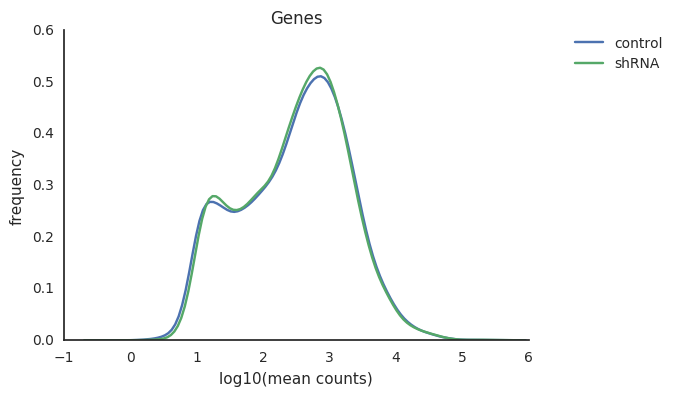

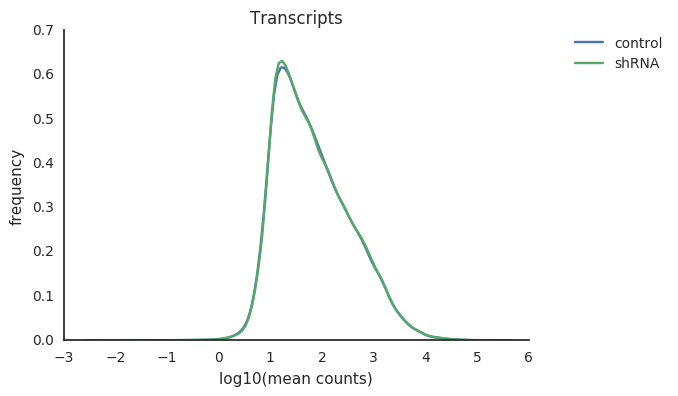

In [14]:
print datetime.now()
def plotKDE(df,title,figName,targets=None,samples=samples):
    """
    Plots KDEs on GetData() outputs.
    
    :param df: dataframe output of GetData()
    :param title: plot title
    :param figName: /path/to/saved/figure/prefix
    :param targets: list of ids to filter and subplot
    :param samples: list of samples in df that should be plotted
    
    :returns: nothing 
    """
    
    sns.set_style("white")
    for s in samples:
        sns.kdeplot( df[s].apply(lambda x: np.log10(x)) )
    
    if targets:
        if title=="Genes":
            df_=df[df["gene_id"].isin(targets)]
        elif title == "Transcripts":
            df_=df[df["transcript_id"].isin(targets)]

        for s in samples:
            sns.kdeplot( df_[s].apply(lambda x: np.log10(x)),label=s+" (RBP targets)" )

    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.xlabel("log10(mean counts)")
    plt.ylabel("frequency")
    plt.title(title)
    plt.legend(loc=1, borderaxespad=0,bbox_to_anchor=(1.3, 1))
    
    plt.savefig(figName+".png",dpi=300,bbox_inches='tight', pad_inches=0.1,format='png')
    plt.savefig(figName+".svg",dpi=300,bbox_inches='tight', pad_inches=0.1,format='svg')

    plt.show()
        
plotKDE(dfGenes,'Genes',outFigures+"Figure1")
plotKDE(dfTranscripts,'Transcripts',outFigures+"Figure2")


2016-10-29 12:39:19.180197


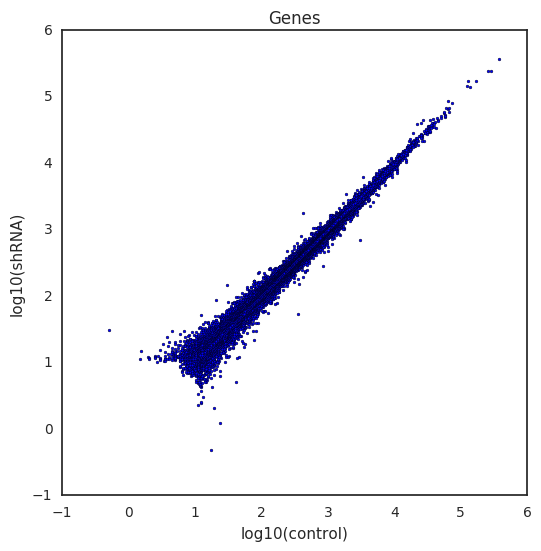

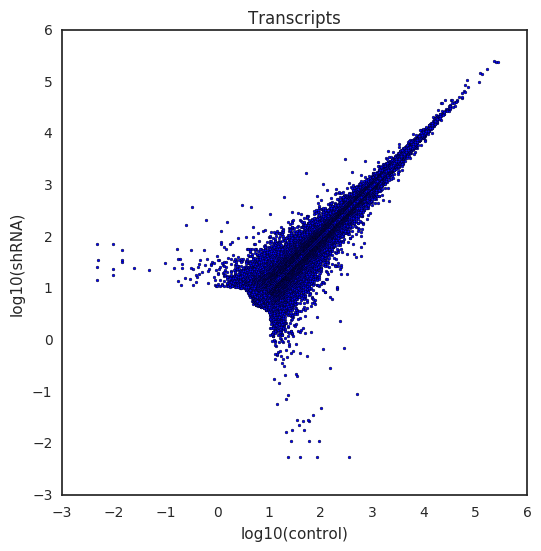

In [15]:
print datetime.now()
def plotScater(df,title,figName,c=samples):
    """
    Plots scatter plots on GetData() outputs.
    
    :param df: dataframe output of GetData()
    :param title: plot title
    :param figName: /path/to/saved/figure/prefix
    :param samples: pair of samples to be plotted in list format
    
    :returns: nothing 
    """
    
    df_=df[df[c[0]]>0]
    df_=df_[df_[c[1]]>0]
    Xdata=df_[c[0]].apply(lambda x: np.log10(x))
    Ydata=df_[c[1]].apply(lambda x: np.log10(x))

    fig = plt.gcf()
    fig.set_size_inches(6, 6)

    plt.scatter(Xdata,Ydata,s=4)
    plt.xlabel("log10(%s)" %str(c[0]) )
    plt.ylabel("log10(%s)" %str(c[1]))
    plt.title(title)
    plt.savefig(figName+".png",dpi=300,bbox_inches='tight', pad_inches=0.1,format='png')
    plt.savefig(figName+".svg",dpi=300,bbox_inches='tight', pad_inches=0.1,format='svg')

    plt.show()
        
plotScater(dfGenes,'Genes',outFigures+"Figure3")
plotScater(dfTranscripts,'Transcripts',outFigures+"Figure4")

Significantly changed genes tend to accumulate towards the higher levels of expression as they are also more easy to detect and quantify.

To identifiy genes strongly changed in relation to others with the same expression level we plot the *log2(fold cahnge)* of each gene in function of it's *normalised intensities* ie. *log10(sqrt(expression in condition 1 * expression in condition 2))*. 

We divide the genes through bins depending on their normalised intensities, identify the corresponding 0.5 *log2(fold change)* percentile for each bin, and fit a polynomial curve. 

To identify genes of interest we mark genes out of the 0.5 percentile which are also significantly changed with red.



2016-10-29 12:39:29.946190


/home/jovyan/AGEpy/AGEpy/AGEpy.py:1724: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df_b["bin"]=pd.cut(df_b["normalized intensities (%s vs. %s)" %( str(c[0]), str(c[1]) ) ].tolist(), nbins,labels=False)


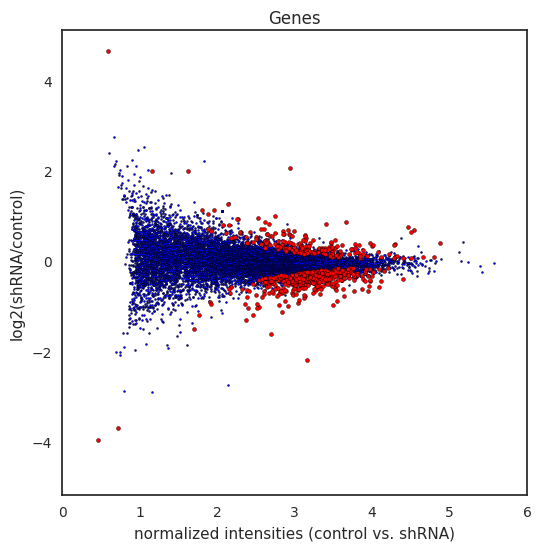

red, significantly changed genes


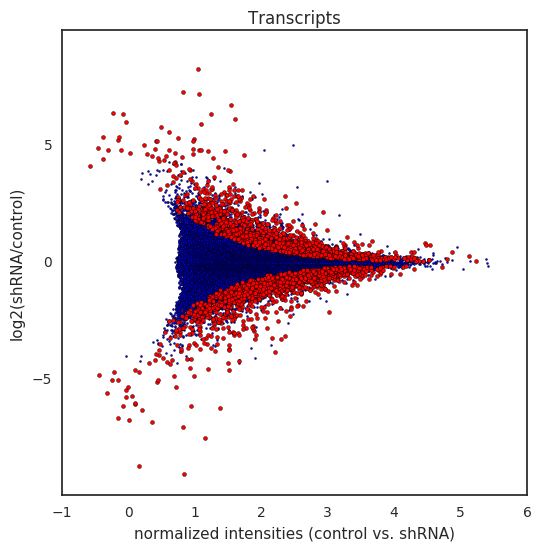

red, significantly changed transcripts


/home/jovyan/AGEpy/AGEpy/AGEpy.py:1786: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  red=df_[df_["OutBounds"]==1][df_["gene_id"].isin(Targets)]["gene_id"].tolist()
/home/jovyan/AGEpy/AGEpy/AGEpy.py:1787: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  Xdata_=df_[df_["OutBounds"]==1][df_["gene_id"].isin(Targets)]["normalized intensities (%s vs. %s)" %( str(c[0]), str(c[1]) )].tolist()
/home/jovyan/AGEpy/AGEpy/AGEpy.py:1788: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  Ydata_=df_[df_["OutBounds"]==1][df_["gene_id"].isin(Targets)]["log2(%s/%s)" %( str(c[1]), str(c[0]) )].tolist()


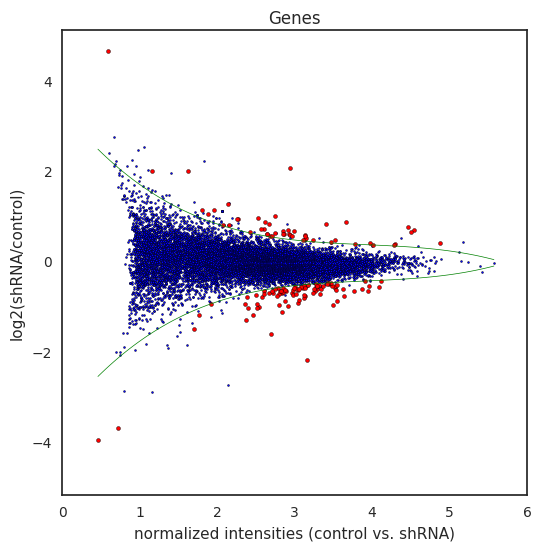

(A) red, significantly changed genes out of the 0.5 percentil


/home/jovyan/AGEpy/AGEpy/AGEpy.py:1782: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  red=df_[df_["OutBounds"]==1][df_["transcript_id"].isin(Targets)]["transcript_id"].tolist()
/home/jovyan/AGEpy/AGEpy/AGEpy.py:1783: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  Xdata_=df_[df_["OutBounds"]==1][df_["transcript_id"].isin(Targets)]["normalized intensities (%s vs. %s)" %( str(c[0]), str(c[1]) ) ].tolist()
/home/jovyan/AGEpy/AGEpy/AGEpy.py:1784: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  Ydata_=df_[df_["OutBounds"]==1][df_["transcript_id"].isin(Targets)]["log2(%s/%s)" %( str(c[1]), str(c[0]) ) ].tolist()


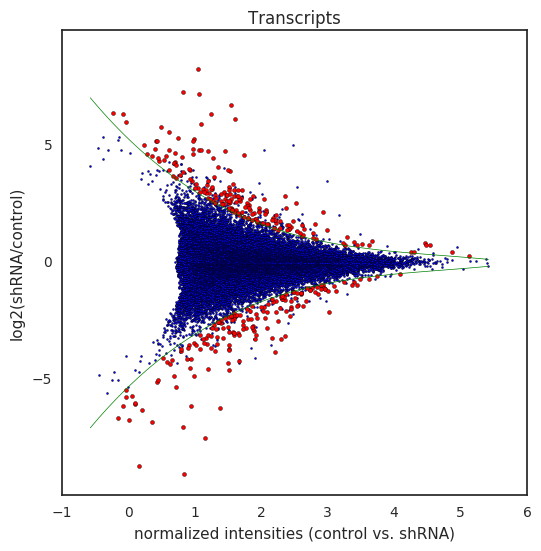

(A) red,  significantly changed transcripts out of the 0.5 percentil


In [16]:
print datetime.now()

dfGenesWout,redGenesOut=age.MA(dfGenes,'Genes',outFigures+"Figure5",list_of_comparisons,spec=sigGenes,splines=False)
print "red, significantly changed genes"
sys.stdout.flush()

dfTranscriptsWout,redTranscriptsOut=age.MA(dfTranscripts,'Transcripts',outFigures+"Figure6",list_of_comparisons,spec=sigTranscripts,splines=False)  
print "red, significantly changed transcripts"
sys.stdout.flush()

dfGenesWoutA,redGenesOutA=age.MA(dfGenes,'Genes',outFigures+"Figure7",list_of_comparisons,Targets=sigGenes)
print "(A) red, significantly changed genes out of the 0.5 percentil"
sys.stdout.flush()

dfTranscritpsWoutA,redTranscriptsOutA=age.MA(dfTranscripts,'Transcripts',outFigures+"Figure8",list_of_comparisons,Targets=sigTranscripts)
print "(A) red,  significantly changed transcripts out of the 0.5 percentil"
sys.stdout.flush()


We now analyse the peaks from the eCLIP data.
We start by streaming the data from ENCODE into a dataframe:

# 6. Read eCLIP peaks

In [17]:
print datetime.now()

# We start by streaming the data from ENCODE into a dataframe
bed_A=age.GetBEDnarrowPeakgz(eCLIP_1_bednarrowPeak)
bed_B=age.GetBEDnarrowPeakgz(eCLIP_2_bednarrowPeak)

# We transform the dataframe into an object of the class bedtool, 
# suitable for usage with the functions in the pybedtools package
bedtool_A=age.dfTObedtool(bed_A)
bedtool_B=age.dfTObedtool(bed_B)

2016-10-29 12:40:00.734507


In [18]:
print datetime.now()

# We intersect both bed files and get all original entries in the ouput
bedtool_AB = bedtool_A.intersect(bedtool_B,wo=True,s=True)

# We transform the intersect into a Pandas dataframe
dfPeaks=pd.read_table(bedtool_AB.fn, names=["chrom_A","chromStart_A","chromEnd_A","name_A","score_A","strand_A",\
                                       "signal_Value_A","-log10(pValue)_A","-log10(qValue)_A","peak_A",\
                                       "chrom_B","chromStart_B","chromEnd_B","name_B","score_B","strand_B",\
                                       "signal_Value_B","-log10(pValue)_B","-log10(qValue)_B","peak_B",\
                                       "overlap"])

2016-10-29 12:40:11.130587


In [19]:
print datetime.now()

# We intersect both bed files returning only the common regions
bedtool_AB_ = bedtool_A.intersect(bedtool_B,s=True)
dfPeaks_=pd.read_table(bedtool_AB_.fn, names=["chrom","chromStart","chromEnd","name","score","strand",\
                                       "signal_Value","-log10(pValue)","-log10(qValue)","peak"])

# We concatenate both complete and common-only intersects side-by-side
dfPeaks=pd.concat([dfPeaks_,dfPeaks],axis=1)
dfPeaks.reset_index(inplace=True, drop=True)

# We rename each row on the name section of the bed 
dfPeaks["name"]=dfPeaks_.index.tolist()
dfPeaks["name"]="Peak_"+dfPeaks["name"].astype(str)

2016-10-29 12:40:11.255338


In [20]:
print datetime.now()

# We filter to peaks where the p-value was bellow 0.05 in at 
# least one replicate
filteredPeaks=dfPeaks[( dfPeaks["-log10(pValue)_A"].astype(float)>(np.log10(0.05)*-1.00) ) | \
                 ( dfPeaks["-log10(pValue)_B"].astype(float)>(np.log10(0.05)*-1.00) )]

# For each of the report values we calculcate the mean between the 2 beds
for i in ["-log10(pValue)","signal_Value","-log10(qValue)","score","peak"]:
    filteredPeaks[i]=filteredPeaks[["%s_A" %i,"%s_B" %i]] .mean(axis=1)

dfPeaks=filteredPeaks[["chrom","chromStart","chromEnd","name","score","strand",\
                        "signal_Value","-log10(pValue)","-log10(qValue)","peak"]]
dfPeaks=dfPeaks.drop_duplicates()
dfPeaks.reset_index(inplace=True, drop=True)

dfPeaksA=filteredPeaks[["chrom_A","chromStart_A","chromEnd_A","name_A","score_A","strand_A",\
                        "signal_Value_A","-log10(pValue)_A","-log10(qValue)_A","peak_A"]]
dfPeaksA.columns=["chrom","chromStart","chromEnd","name","score","strand",\
                  "signal_Value","-log10(pValue)","-log10(qValue)","peak"]

dfPeaksA=dfPeaksA.drop_duplicates()
dfPeaksA.reset_index(inplace=True, drop=True)

dfPeaksB=filteredPeaks[["chrom_B","chromStart_B","chromEnd_B","name_B","score_B","strand_B",\
                        "signal_Value_B","-log10(pValue)_B","-log10(qValue)_B","peak_B"]]
dfPeaksB.columns=["chrom","chromStart","chromEnd","name","score","strand",\
                  "signal_Value","-log10(pValue)","-log10(qValue)","peak"]
dfPeaksB=dfPeaksB.drop_duplicates()
dfPeaksB.reset_index(inplace=True, drop=True)

bedtool_AB = age.dfTObedtool(dfPeaks)
bedtool_A = age.dfTObedtool(dfPeaksA)
bedtool_B = age.dfTObedtool(dfPeaksB)

2016-10-29 12:40:11.383902


/opt/conda/envs/ipykernel_py2/lib/python2.7/site-packages/ipykernel/__main__.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [21]:
print datetime.now()
GTF=age.readGTF(outFolder+"rsem-results/annotation.gtf")
parsedGTF=pd.read_table(outFolder+"parsedGTF.tsv")

2016-10-29 12:40:11.857270


In [22]:
print datetime.now()

# We get the intersect of each respective bed with the 
# matching exons, transcripts, and genes and normalize the
# values (eg. signal_Value ) to each of these features
dfTargets=age.GetPeaksExons(bedtool_AB,parsedGTF)
dfTargetsA=age.GetPeaksExons(bedtool_A,parsedGTF)
dfTargetsB=age.GetPeaksExons(bedtool_B,parsedGTF)

2016-10-29 12:40:41.395129


***** WARNING: File /tmp/pybedtools.pZYHk2.tmp has inconsistent naming convention for record:
GL000008.2	118091	118173	ENSE00003729529.1	.	+

***** WARNING: File /tmp/pybedtools.pZYHk2.tmp has inconsistent naming convention for record:
GL000008.2	118091	118173	ENSE00003729529.1	.	+

/home/jovyan/AGEpy/AGEpy/AGEpy.py:1923: RuntimeWarning: overflow encountered in double_scalars
  tmp=tmp.groupby(field).apply(lambda l: reduce(lambda x, y: x*y, l["-log10(pValue)"]) )
***** WARNING: File /tmp/pybedtools.nWydFB.tmp has inconsistent naming convention for record:
GL000008.2	118091	118173	ENSE00003729529.1	.	+

***** WARNING: File /tmp/pybedtools.nWydFB.tmp has inconsistent naming convention for record:
GL000008.2	118091	118173	ENSE00003729529.1	.	+

***** WARNING: File /tmp/pybedtools.NyQ9u_.tmp has inconsistent naming convention for record:
GL000008.2	118091	118173	ENSE00003729529.1	.	+

***** WARNING: File /tmp/pybedtools.NyQ9u_.tmp has inconsistent naming convention for record:
GL000008.2	1

In [23]:
print datetime.now()
TargetE=dfTargets["exon_id"].tolist()
TargetE=[ ss for ss in TargetE if str(ss) != "nan" ]

TargetT=parsedGTF[parsedGTF["exon_id"].isin(TargetE)]["transcript_id"].tolist()
TargetT=[ ss for ss in TargetT if str(ss) != "nan" ]

TargetG=parsedGTF[parsedGTF["exon_id"].isin(TargetE)]["gene_id"].tolist()
TargetG=[ ss for ss in TargetG if str(ss) != "nan" ]
                 
print "type\t", "exons\ttranscritps\tgenes\t"
print "total\t", "%i\t%i\t%i\t" %(len(TargetE), len(TargetT), len(TargetG))
print "unique\t", "%i\t%i\t%i\t" %(len(set(TargetE)) , len(set(TargetT)), len(set(TargetG))) 

2016-10-29 12:41:02.714482
type	exons	transcritps	genes	
total	8276	8941	8941	
unique	3162	3436	1465	


# 7. Merging RNAseq and eCLIP

In [24]:
print datetime.now()

# We define shRNA related genes - shGenes -  as the genes which are out
# of the bounds of the percentil of choice on the MA plot 
shGenes=dfGenesWout[dfGenesWout["OutBounds"]==1]["gene_id"].tolist()
shTranscripts=dfTranscriptsWout[dfTranscriptsWout["OutBounds"]==1]["transcript_id"].tolist()

2016-10-29 12:41:02.957807


2016-10-29 12:41:02.986255


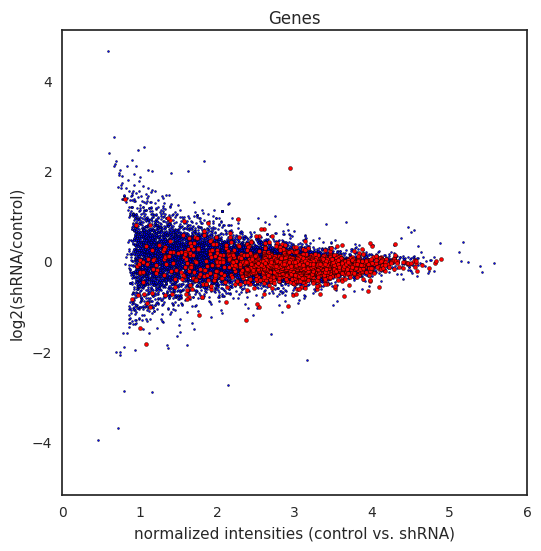

(B) red, RBP target genes


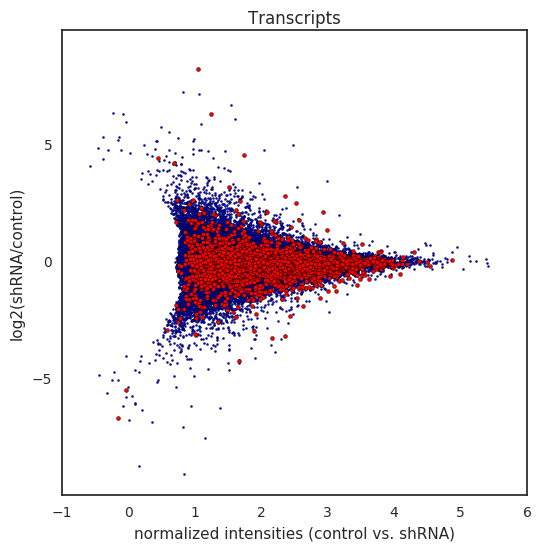

(B) red, RBP target transcripts


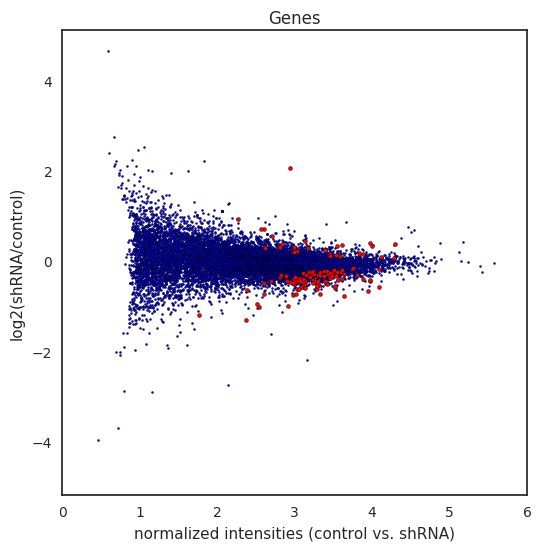

(C) red, significantly changed RBP target genes


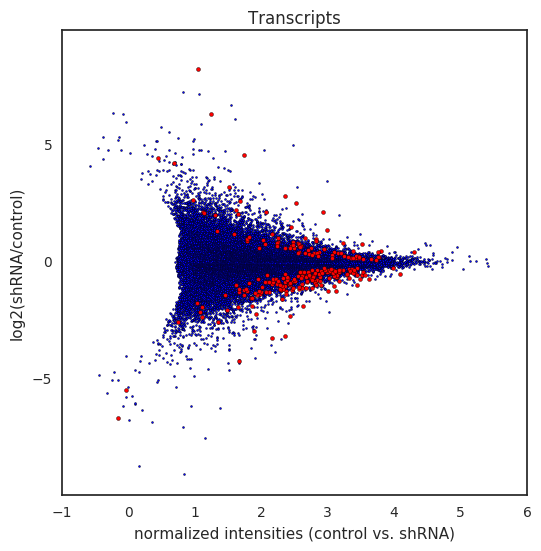

(C) red, significantly changed RBP target transcripts


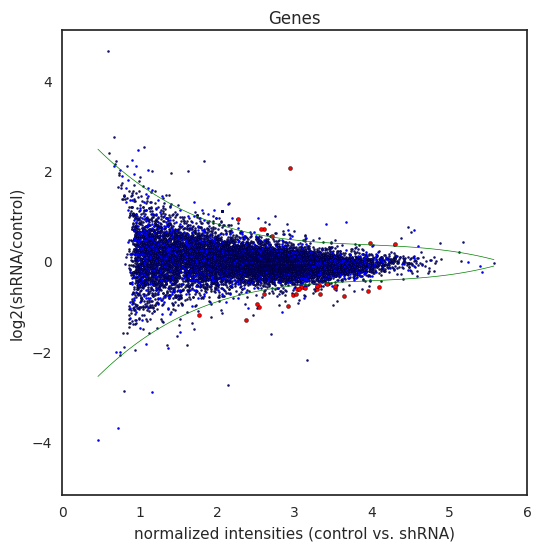

(D) red, significantly changed RBP target genes out of the 0.5 percentil


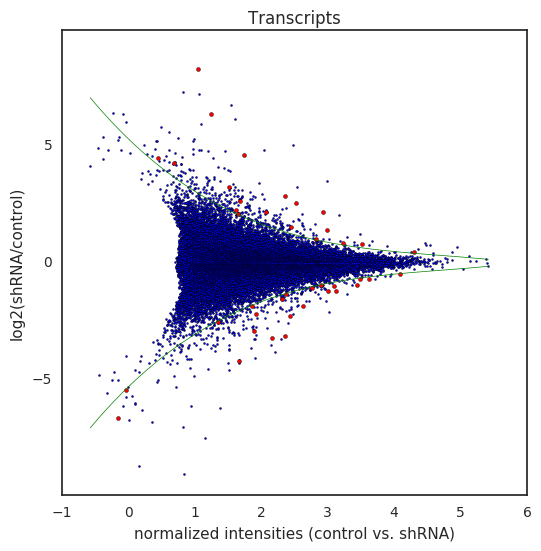

(D) red, significantly changed RBP target transcript out of the 0.5 percentil


In [25]:
print datetime.now()
dfGenesWoutB,redGenesOutB=age.MA(dfGenes,'Genes',outFigures+"Figure9",list_of_comparisons,spec=TargetG,splines=False)
print "(B) red, RBP target genes"
sys.stdout.flush()

dfTranscritpsWoutB,redTranscriptsOutB=age.MA(dfTranscripts,'Transcripts',outFigures+"Figure10",list_of_comparisons,spec=TargetT, splines=False)
print "(B) red, RBP target transcripts"
sys.stdout.flush()

# We define the list of RBP Target Genes that are differentially
# expressed (TargetG_dif) if a gene (s) for each gene (s) in the 
# list of RBP targets (TargetG) are also in the list of 
# significantly changed genes (sigGenes)
TargetG_dif=[ s for s in TargetG if s in sigGenes ]
TargetT_dif=[ s for s in TargetT if s in sigTranscripts ]

dfGenesWoutC,redGenesOutC=age.MA(dfGenes,'Genes',outFigures+"Figure11",list_of_comparisons,spec=TargetG_dif,splines=False)
print "(C) red, significantly changed RBP target genes"
sys.stdout.flush()

dfTranscritpsWoutC,redTranscriptsOutC=age.MA(dfTranscripts,'Transcripts',outFigures+"Figure12",list_of_comparisons,spec=TargetT_dif,splines=False)
print "(C) red, significantly changed RBP target transcripts"
sys.stdout.flush()

dfGenesWoutD,redGenesOutD=age.MA(dfGenes,'Genes',outFigures+"Figure13",list_of_comparisons,Targets=TargetG_dif)
print "(D) red, significantly changed RBP target genes out of the 0.5 percentil"
sys.stdout.flush()

dfTranscritpsWoutD,redTranscriptsOutD=age.MA(dfTranscripts,'Transcripts',outFigures+"Figure14",list_of_comparisons,Targets=TargetT_dif)
print "(D) red, significantly changed RBP target transcript out of the 0.5 percentil"
sys.stdout.flush()


2016-10-29 12:41:49.554730


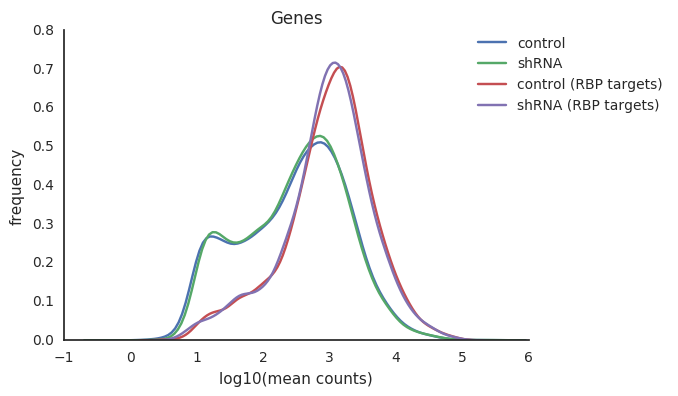

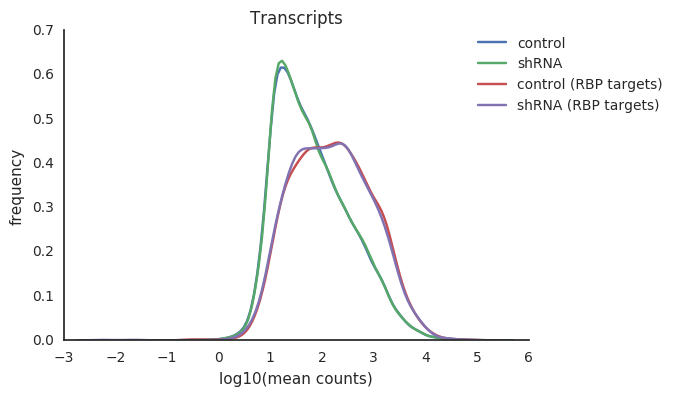

In [26]:
print datetime.now()
        
plotKDE(dfGenes,'Genes',outFigures+"Figure15",dfTargets["gene_id"].tolist())
plotKDE(dfTranscripts,'Transcripts',outFigures+"Figure16",dfTargets["transcript_id"].tolist())

2016-10-29 12:41:51.201742


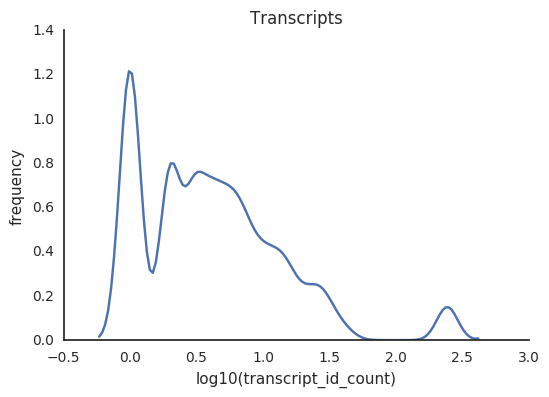

In [27]:
print datetime.now()
def plotKDE_nbind(df,title,targetCol,figName):
    """
    Plots KDEs on any field of choice from a Pandas dataframe.
    
    :param df: Pandas dataframe 
    :param title: plot title
    :param targetCol: header of the column to use
    :param figName: /path/to/saved/figure/prefix
    
    :returns: nothing 
    """

    sns.set_style("white")
    
    df_=df[["transcript_id",targetCol]].drop_duplicates()
    sns.kdeplot( df[targetCol].apply(lambda x: np.log10(x)) )

    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.xlabel("log10(%s)" %targetCol)
    plt.ylabel("frequency")
    plt.title(title)
    plt.gca().legend().set_visible(False)
    plt.savefig(figName+".png",dpi=300,bbox_inches='tight', pad_inches=0.1,format='png')
    plt.savefig(figName+".svg",dpi=300,bbox_inches='tight', pad_inches=0.1,format='svg')
    plt.show()
        
plotKDE_nbind(dfTargets,'Transcripts','transcript_id_count',outFigures+"Figure17")

2016-10-29 12:41:52.118508


/opt/conda/envs/ipykernel_py2/lib/python2.7/site-packages/ipykernel/__main__.py:125: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/opt/conda/envs/ipykernel_py2/lib/python2.7/site-packages/ipykernel/__main__.py:126: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/opt/conda/envs/ipykernel_py2/lib/python2.7/site-packages/ipykernel/__main__.py:127: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


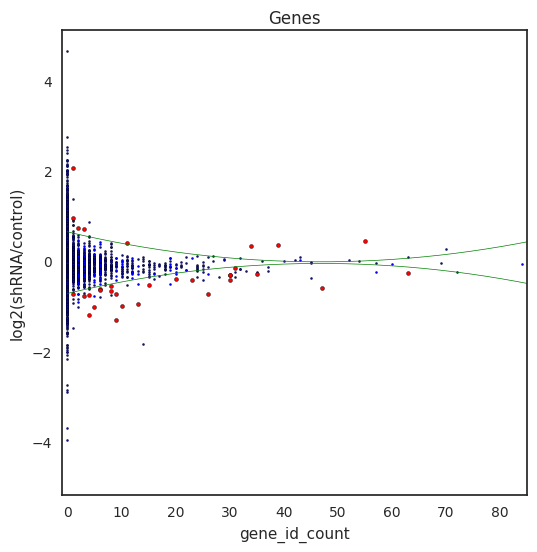

/opt/conda/envs/ipykernel_py2/lib/python2.7/site-packages/ipykernel/__main__.py:121: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/opt/conda/envs/ipykernel_py2/lib/python2.7/site-packages/ipykernel/__main__.py:122: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/opt/conda/envs/ipykernel_py2/lib/python2.7/site-packages/ipykernel/__main__.py:123: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


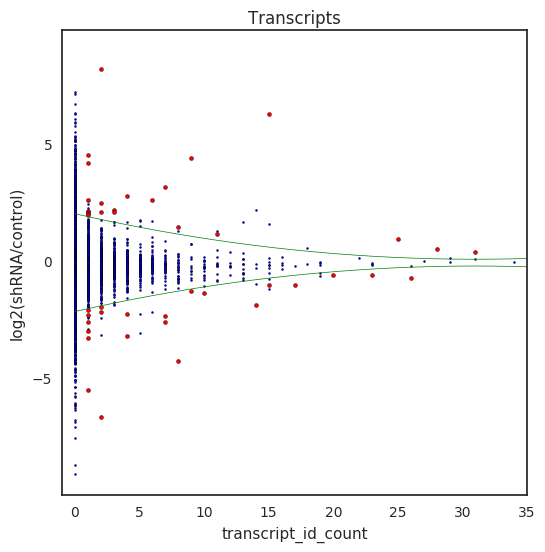

In [28]:
print datetime.now()
def MA_(df,title,figName,c=list_of_comparisons, daType="counts",nbins=10,perc=.1,deg=3,eq=True,splines=True,spec=None,Targets=None,ylim=None,sizeRed=8, dfTargetsAn=dfTargets, targetCol='transcript_id_count',spMAX=None):    
    """
    Plots an MA like plot using a column of choice for normalized.
    
    :param df: dataframe output of GetData()
    :param title: plot title, 'Genes' or 'Transcripts'
    :param figName: /path/to/saved/figure/prefix
    :param c: pair of samples to be plotted in list format
    :param daType: data type, ie. 'counts' or 'FPKM'
    :param nbins: number of bins on normalized intensities to fit the splines
    :param per: log2(fold change) percentil to which the splines will be fitted
    :param deg: degress of freedom used to fit the splines
    :param eq: if true assumes for each bin that the lower and upper values are equally distant to 0, taking the smaller distance for both
    :param spec: list of ids to be highlighted 
    :param Targets: list of ids that will be highlighted if outside of the fitted splines
    :param ylim: a list of limits to apply on the y-axis of the plot
    :param sizeRed: size of the highlight marker
    :param dfTargetsAn: a Pandas dataframe with the 'targetCol' and the respective ids of values to plot in the x axis
    :param targetCol: target column to use in the x axis eg. 'transcript_id_count'
    :param spMAX: maximum values of x to use for the splines

    :returns df_: a Pandas dataframe similar to the GetData() output with normalized intensities and spline outbounds rows marked as 1.
    :returns red: list of ids that are highlighted
    """

    df_=df[df[c[0]]>0]
    df_=df_[df_[c[1]]>0]
    
    if title == "Transcripts":
        dfTargets_=dfTargetsAn[["transcript_id",targetCol]].drop_duplicates()
        df_=pd.merge(df_,dfTargets_,on=["transcript_id"],how="left")
    elif title == "Genes":
        dfTargets_=dfTargetsAn[["gene_id",targetCol]].drop_duplicates()
        df_=pd.merge(df_,dfTargets_,on=["gene_id"],how="left")
    
    df_=df_.fillna(0)
    
    df_["normalized intensities (%s vs. %s)" %( str(c[0]), str(c[1]) ) ]=df_[targetCol]#.apply(lambda x: np.log10(x)) 
    
    if daType=="counts":
        lowLim=-1
    elif daType=="FPKM":
        lowLim=np.log10(0.1)
            
    df_b=df_[df_["normalized intensities (%s vs. %s)" %( str(c[0]), str(c[1]) ) ]>lowLim ]
    df_b.reset_index(inplace=True, drop=True)

    Xdata=df_["normalized intensities (%s vs. %s)" %( str(c[0]), str(c[1]) ) ].tolist()
    Ydata=df_["log2(%s/%s)" %( str(c[1]), str(c[0]) )].tolist()

    minX=min(Xdata)
    maxX=max(Xdata)

    minX_=min(df_b["normalized intensities (%s vs. %s)" %( str(c[0]), str(c[1]) ) ].tolist())
    maxX_=max(df_b["normalized intensities (%s vs. %s)" %( str(c[0]), str(c[1]) ) ].tolist())

    df_b["bin"]=df_b["normalized intensities (%s vs. %s)" %( str(c[0]), str(c[1]) ) ]
    
    spl=[]
    for b in set( df_b["bin"].tolist() ):
        tmp=df_b[df_b["bin"]==b]
        Xbin = tmp["normalized intensities (%s vs. %s)" %( str(c[0]), str(c[1]) ) ].tolist()
        Xval = np.mean([max(Xbin),min(Xbin)])
        Ybin = tmp["log2(%s/%s)" %( str(c[1]), str(c[0]) )].tolist()
        YvalP=np.percentile(Ybin,100.00-float(perc)) 
        YvalM=np.percentile(Ybin,float(perc))
        spl.append([Xval,YvalP,YvalM])

    spl=pd.DataFrame( spl,columns=["X","Upper","Lower"],index=range(len(spl)) )
    
    def CheckMin(df):
        U=abs(df["Upper"])
        L=abs(df["Lower"])
        return min([U,L])

    spl["min"]=spl.apply(CheckMin, axis=1)
    spl=spl[spl["min"]!=0]
    if spMAX:
        spl=spl[spl["X"]<spMAX]
    else:
        spl=spl[spl["X"]<35]

    coeffsUpper = np.polyfit(spl["X"].tolist(), spl["Upper"].tolist(), deg)
    coeffsLower = np.polyfit(spl["X"].tolist(), spl["Lower"].tolist(), deg) 

    Xspl = np.array(np.linspace(minX, maxX, 10*nbins)) 

    if eq:
        coeffsUpper = np.polyfit(spl["X"].tolist(), spl["min"].tolist(), deg)
        coeffsLower = np.polyfit(spl["X"].tolist(), [ ss*-1 for ss in spl["min"].tolist()] , deg) 
        YsplUpper = np.polyval(coeffsUpper, Xspl)
        YsplLower = np.polyval(coeffsLower, Xspl)

    else:
        coeffsUpper = np.polyfit(spl["X"].tolist(), spl["Upper"].tolist(), deg)
        coeffsLower = np.polyfit(spl["X"].tolist(), spl["Lower"].tolist(), deg) 
        YsplUpper = np.polyval(coeffsUpper, Xspl)
        YsplLower = np.polyval(coeffsLower, Xspl)
    
    def checkOutbounds(df,Xspl=Xspl,coeffsUpper=coeffsUpper,coeffsLower=coeffsLower,c=c):
        x=df["normalized intensities (%s vs. %s)" %( str(c[0]), str(c[1]) )]
        y=df["log2(%s/%s)" %( str(c[1]), str(c[0]) )]
        if y < 0:
            v=np.polyval(coeffsLower, x)
            if y < v:
                return 1
            else:
                return 0
        else:
            v=np.polyval(coeffsUpper, x)
            if y > v:
                return 1
            else:
                return 0

    df_["OutBounds"]=df_.apply(checkOutbounds,axis=1)

    if Targets:
        if title == "Transcripts":
            red=df_[df_["OutBounds"]==1][df_["transcript_id"].isin(Targets)]["transcript_id"].tolist()
            Xdata_=df_[df_["OutBounds"]==1][df_["transcript_id"].isin(Targets)]["normalized intensities (%s vs. %s)" %( str(c[0]), str(c[1]) ) ].tolist()
            Ydata_=df_[df_["OutBounds"]==1][df_["transcript_id"].isin(Targets)]["log2(%s/%s)" %( str(c[1]), str(c[0]) ) ].tolist()
        elif title == "Genes":
            red=df_[df_["OutBounds"]==1][df_["gene_id"].isin(Targets)]["gene_id"].tolist()
            Xdata_=df_[df_["OutBounds"]==1][df_["gene_id"].isin(Targets)]["normalized intensities (%s vs. %s)" %( str(c[0]), str(c[1]) )].tolist()
            Ydata_=df_[df_["OutBounds"]==1][df_["gene_id"].isin(Targets)]["log2(%s/%s)" %( str(c[1]), str(c[0]) )].tolist()
    elif spec:
        if title == "Transcripts":
            red=df_[df_["transcript_id"].isin(spec)]["transcript_id"].tolist()
            Xdata_=df_[df_["transcript_id"].isin(spec)]["normalized intensities (%s vs. %s)" %( str(c[0]), str(c[1]) ) ].tolist()
            Ydata_=df_[df_["transcript_id"].isin(spec)]["log2(%s/%s)" %( str(c[1]), str(c[0]) ) ].tolist()
        elif title == "Genes":
            red=df_[df_["gene_id"].isin(spec)]["gene_id"].tolist()
            Xdata_=df_[df_["gene_id"].isin(spec)]["normalized intensities (%s vs. %s)" %( str(c[0]), str(c[1]) )].tolist()
            Ydata_=df_[df_["gene_id"].isin(spec)]["log2(%s/%s)" %( str(c[1]), str(c[0]) )].tolist()   
    else:
        Xdata_=df_[df_["OutBounds"]==1]["normalized intensities (%s vs. %s)" %( str(c[0]), str(c[1]) ) ].tolist()
        Ydata_=df_[df_["OutBounds"]==1]["log2(%s/%s)" %( str(c[1]), str(c[0]) ) ].tolist()
        if title == "Transcripts":
            red=df_[df_["OutBounds"]==1]["transcript_id"].tolist()
        elif title == "Genes":
            red=df_[df_["OutBounds"]==1]["gene_id"].tolist()
        
    fig = plt.gcf()

    fig.set_size_inches(6, 6)
    plt.scatter(Xdata,Ydata, s=2)
    plt.scatter(Xdata_,Ydata_,s=sizeRed, c='r')
    if splines:
        plt.plot(Xspl,YsplUpper, "-",lw=0.5, c='g')
        plt.plot(Xspl,YsplLower,"-", lw=0.5,c='g')
        
    plt.xlabel("%s" %targetCol )
    plt.ylabel("log2(%s/%s)" %( str(c[1]), str(c[0]) ))

    if ylim:
        plt.ylim(ylim[0],ylim[1])
    else:
        ylims=max([abs(min(Ydata)), abs(max(Ydata)) ])
        plt.ylim(-ylims*1.1,ylims*1.1)
    if spMAX:
        plt.xlim(-1,spMAX)
    else:
        plt.xlim(-1,35)

    plt.title(title)
    
    plt.savefig(figName+".png",dpi=300,bbox_inches='tight', pad_inches=0.1,format='png')
    plt.savefig(figName+".svg",dpi=300,bbox_inches='tight', pad_inches=0.1,format='svg')
    
    plt.show()

    return df_,red

dfGenesWoutE,redGenesOutE=MA_(dfGenes,'Genes',outFigures+'Figure18',Targets=TargetG_dif, targetCol="gene_id_count",nbins=1000,deg=2,perc=.1,eq=True, spMAX=85)#,splines=False)

dfTranscritpsWoutE,redTranscriptsOutE=MA_(dfTranscripts,'Transcripts',outFigures+'Figure19',Targets=TargetT_dif, nbins=1000,deg=2,perc=1,eq=True)#,splines=False)

# 8. Biotype and gene ontology annotations

[Gene ontology](http://geneontology.org), is one of the best examples of the value of proper annotation and curation of gene function and cellular localisation.

For annotating our tables with gene ontology terms as well as gene biotype we will use the biomaRt package for R and ENSEMBL's biomart service. It is here important to realise that ENSEMBL releases a new version of it's biomart database with each genome release and that older database  releases are transfered to [archive.ensembl.org](http://www.ensembl.org/info/website/archives/index.html). In our case, the header of our downloaded GTF clearly indicates we are require a release matching "Ensembl 83" - [dec2015.archive.ensembl.org](dec2015.archive.ensembl.org).

Complete introduction to biomart and the construction of queries can be found [elsewhere](https://bioconductor.org/packages/release/bioc/vignettes/biomaRt/inst/doc/biomaRt.html).

In [29]:
print datetime.now()

2016-10-29 12:42:05.479539


In [30]:
%%R
library("biomaRt")
host="dec2015.archive.ensembl.org"
listMarts(host=host)

               biomart               version
1 ENSEMBL_MART_ENSEMBL      Ensembl Genes 83
2     ENSEMBL_MART_SNP  Ensembl Variation 83
3 ENSEMBL_MART_FUNCGEN Ensembl Regulation 83
4    ENSEMBL_MART_VEGA               Vega 63
5                pride        PRIDE (EBI UK)


In [31]:
%%R
ensembl=useMart("ENSEMBL_MART_ENSEMBL",host=host)
listDatasets(ensembl)

                          dataset                                 description
1          oanatinus_gene_ensembl      Ornithorhynchus anatinus genes (OANA5)
2         cporcellus_gene_ensembl             Cavia porcellus genes (cavPor3)
3         gaculeatus_gene_ensembl      Gasterosteus aculeatus genes (BROADS1)
4          lafricana_gene_ensembl          Loxodonta africana genes (loxAfr3)
5  itridecemlineatus_gene_ensembl  Ictidomys tridecemlineatus genes (spetri2)
6         choffmanni_gene_ensembl         Choloepus hoffmanni genes (choHof1)
7          csavignyi_gene_ensembl              Ciona savignyi genes (CSAV2.0)
8             fcatus_gene_ensembl         Felis catus genes (Felis_catus_6.2)
9        rnorvegicus_gene_ensembl          Rattus norvegicus genes (Rnor_6.0)
10         psinensis_gene_ensembl      Pelodiscus sinensis genes (PelSin_1.0)
11          cjacchus_gene_ensembl   Callithrix jacchus genes (C_jacchus3.2.1)
12        ttruncatus_gene_ensembl          Tursiops truncatus ge

In [32]:
%%R
ensembl = useDataset("hsapiens_gene_ensembl",mart=ensembl)
listAttributes(ensembl) 

                                                              name
1                                                  ensembl_gene_id
2                                            ensembl_transcript_id
3                                               ensembl_peptide_id
4                                                  ensembl_exon_id
5                                                      description
6                                                  chromosome_name
7                                                   start_position
8                                                     end_position
9                                                           strand
10                                                            band
11                                                transcript_start
12                                                  transcript_end
13                                        transcription_start_site
14                                               transcript_le

In [33]:
%%R
attri=c("ensembl_gene_id","go_id","name_1006")
res=getBM(attributes=attri,mart = ensembl)

In [34]:
print datetime.now()

2016-10-29 12:47:17.753866


In [35]:
%Rpull res
def CombineAnn(df):
     return pd.Series(dict(ensembl_gene_id = ', '.join([ s for s in list(set(df['ensembl_gene_id']))  if len(s) > 1 ] ) , 
                        go_id = ', '.join([ s for s in list(set(df['go_id'])) if len(s) > 1 ]),
                        name_1006 = ', '.join([ s for s in list(set(df['name_1006'])) if len(s) > 1 ] )   ) ) 

cols=res.columns.tolist()

res_Genes=res.groupby("ensembl_gene_id").apply(CombineAnn)
res_Genes.reset_index(inplace=True,drop=True)

res_Genes.to_csv(outFolder+"GenesAnnotations.tsv",sep="\t",index=None)

In [36]:
res_Genes=pd.read_table(outFolder+"GenesAnnotations.tsv")

In [37]:
print datetime.now()
def AnnotateDF(df,refcol,annTable=res_Genes,parsedGTF=parsedGTF,dropGeneID=False):
    """
    Annotates a dataframe.
    
    :param df: a Pandas dataframe to be annotated
    :param refcol: the header of the column containing the ids to be annotated
    :param annTable: a table with annotations
    :param parsedGTF: a parsed GTF as outputed by parseGTF()
    :param dropGeneID: if you are merging on transcript_id and the df already has gene_id in the header set this to True
    
    :returns: a Pandas dataframe
    """ 
    
    df=df.copy()
    parsedGTF_=parsedGTF[['gene_id','gene_name','transcript_id','gene_type']].astype(str).drop_duplicates()
    parsedGTF_=parsedGTF_[parsedGTF_[refcol].astype(str)!="nan"]
    def CombineAnn(df):
            return pd.Series(dict(gene_id = ', '.join([ s for s in list(set(df['gene_id']))  if s != "nan" ] ) , 
                        gene_name = ', '.join([ s for s in list(set(df['gene_name'])) if s != "nan" ]),
                        transcript_id = ', '.join([ s for s in list(set(df['transcript_id'])) if s != "nan" ] ) ,
                        gene_type = ', '.join([ s for s in list(set(df['gene_type'])) if s != "nan" ] ) ) ) 
    
    # As defined in http://pandas.pydata.org/pandas-docs/stable/groupby.html
    # By “group by” we are referring to a process involving one or more of the following steps
    # Splitting the data into groups based on some criteria
    # Applying a function to each group independently
    # Combining the results into a data structure
    id_name=parsedGTF_.groupby(refcol).apply(CombineAnn)
    
    if dropGeneID:
        id_name=id_name.drop(["gene_id"],axis=1)
    df=pd.merge(df,id_name, on=refcol, how="left")
    bads=[s for s in ['gene_id','transcript_id'] if s != refcol][0]
    dfBads=df[df[bads].astype(str)=="nan"]
    if len(dfBads) > 0:
        bads_=dfBads[refcol].tolist()
        bads_=[ str(s) for s in bads_ ]
        bads_="\n".join(bads_)
        print refcol
        print "For the following %s no %s could be found:\n%s" %(refcol, bads, bads_)
        sys.stdout.flush()
    df["ensembl_gene_id"]=df["gene_id"].apply(lambda x: x.split(".")[0])
    df=pd.merge(df,annTable,on="ensembl_gene_id", how="left")
    return df

dfGenesAn=AnnotateDF(dfGenesWout,"gene_id")
dfTranscriptsAn=AnnotateDF(dfTranscriptsWout,"transcript_id")
dfTargetsAn=AnnotateDF(dfTargets,"transcript_id",dropGeneID=True)

2016-10-29 12:47:29.040724
gene_id
For the following gene_id no transcript_id could be found:
gSpikein_ERCC-00076
gSpikein_ERCC-00061
gSpikein_ERCC-00126
gSpikein_ERCC-00168
gSpikein_ERCC-00098
gSpikein_ERCC-00112
gSpikein_ERCC-00097
gSpikein_ERCC-00074
gSpikein_ERCC-00077
gSpikein_ERCC-00004
gSpikein_ERCC-00054
gSpikein_ERCC-00083
gSpikein_ERCC-00069
gSpikein_ERCC-00148
gSpikein_ERCC-00162
gSpikein_ERCC-00144
gSpikein_ERCC-00171
gSpikein_ERCC-00095
gSpikein_ERCC-00017
gSpikein_ERCC-00067
gSpikein_ERCC-00145
gSpikein_ERCC-00024
gSpikein_ERCC-00123
gSpikein_ERCC-00044
gSpikein_ERCC-00043
gSpikein_ERCC-00062
gSpikein_ERCC-00138
gSpikein_ERCC-00131
gSpikein_ERCC-00012
gSpikein_ERCC-00073
gSpikein_ERCC-00051
gSpikein_ERCC-00158
gSpikein_ERCC-00157
gSpikein_ERCC-00039
gSpikein_ERCC-00111
gSpikein_ERCC-00108
gSpikein_ERCC-00078
gSpikein_ERCC-00096
gSpikein_ERCC-00075
gSpikein_ERCC-00160
gSpikein_ERCC-00081
gSpikein_ERCC-00002
gSpikein_ERCC-00060
gSpikein_ERCC-00134
gSpikein_ERCC-00104
gSpike

# 9. Clustering and heatmaps

We start by preparing a dataframe with log10(expression) values. We merge *gene_id* and *gene_name* for each gene as they are most informative than each isolated while being non-redundant.

In [38]:
print datetime.now()
forHeatmap=dfGenesAn[dfGenesAn["sig"]=="yes"][["gene_id","gene_name","shRNA","control"]]
forHeatmap["labels"]=forHeatmap["gene_name"].astype(str)+"_"+forHeatmap["gene_id"].astype(str)
for f in ["shRNA","control"]:
    forHeatmap[f]=forHeatmap[f].apply(lambda x: np.log10(x))
forHeatmap_=forHeatmap.copy()
forHeatmap.index=forHeatmap["labels"]
forHeatmap=forHeatmap.drop(["labels","gene_id","gene_name"],axis=1)

2016-10-29 12:51:06.845392


In [39]:
print datetime.now()

2016-10-29 12:51:06.935236


In [40]:
%Rpush forHeatmap

To identify the number of clusters that better describes our results we plot the within groups sum of squares in funtion of number of clusters. This is often more an art than a science but once the within groups sum of squares does not change with the increase in number of clusters this defines the optimal number of clusters to separate our data.

/opt/conda/envs/ipykernel_py2/lib/python2.7/site-packages/rpy2-2.8.3-py2.7-linux-x86_64.egg/rpy2/rinterface/__init__.py:185: RRuntimeWarning: 
Attaching package: ‘gplots’


  warnings.warn(x, RRuntimeWarning)
/opt/conda/envs/ipykernel_py2/lib/python2.7/site-packages/rpy2-2.8.3-py2.7-linux-x86_64.egg/rpy2/rinterface/__init__.py:185: RRuntimeWarning: The following object is masked from ‘package:stats’:

    lowess


  warnings.warn(x, RRuntimeWarning)
/opt/conda/envs/ipykernel_py2/lib/python2.7/site-packages/rpy2-2.8.3-py2.7-linux-x86_64.egg/rpy2/rinterface/__init__.py:185: RRuntimeWarning: Loading required package: grid

  warnings.warn(x, RRuntimeWarning)
/opt/conda/envs/ipykernel_py2/lib/python2.7/site-packages/rpy2-2.8.3-py2.7-linux-x86_64.egg/rpy2/rinterface/__init__.py:185: RRuntimeWarning: Loading required package: BiocGenerics

  warnings.warn(x, RRuntimeWarning)
/opt/conda/envs/ipykernel_py2/lib/python2.7/site-packages/rpy2-2.8.3-py2.7-linux-x86_64.egg/rpy2/rinterface/__init__.p

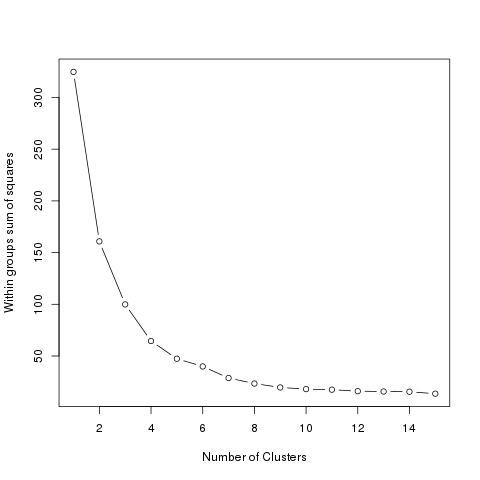

In [41]:
%%R
library('gplots')
library('Gviz')

mat=data.matrix(forHeatmap)
# Determine number of clusters
wss <- (nrow(mat)-1)*sum(apply(mat,2,var))
for (i in 2:15) wss[i] <- sum(kmeans(mat, 
                                     centers=i)$withinss)
plot(1:15, wss, type="b", xlab="Number of Clusters",
     ylab="Within groups sum of squares")

In [42]:
print datetime.now()

2016-10-29 12:51:16.812292


In [43]:
%%R
nclusters=4


# we start by plotting the heatmap
pdf("~/work/results/figures/Figure20.pdf",height = 48*3, width = 48)
heat=heatmap.2(mat,
               scale="none",
               Rowv=TRUE,
               Colv=TRUE,
               srtCol=0,
               offsetCol=8,
               margins=c(10,1), # ("margin.Y", "margin.X")
               trace='none', 
               symkey=FALSE, 
               symbreaks=FALSE, 
               dendrogram='both',
               density.info='none', 
               denscol="black",
               keysize=0,
               cexRow=0.2,
               cexCol=10,
               #( "bottom.margin", "left.margin", "top.margin", "left.margin" )
               key.par=list(mar=c(10.5,0,3,0)),
               # lmat -- added 2 lattice sections (5 and 6) for padding
               lmat=rbind(c(10,7, 4, 6), c(3,1, 2, 8), c(7,9,5,11)), lhei=c(0.25, 5,0.2), lwid=c(4,0.75, 10, 1))
dev.off()

# we extract the row dendrogram and cut the tree at the level 
# indicated by the plot above (nclusters=4)
hc <- as.hclust( heat$rowDendrogram)
groups <- cutree(hc, k=nclusters)
final_cluster=data.frame(groups[hc$order])

# replot the heatmap with RowSideColors=as.character(groups) in order to 
# mark the clusters in a visual fashion
pdf("~/work/results/figures/Figure20.pdf",height = 48*3, width = 48)
heat=heatmap.2(mat,
               scale="none",
               Rowv=TRUE,
               Colv=TRUE,
               srtCol=0,
               offsetCol=8,
               margins=c(10,1), # ("margin.Y", "margin.X")
               trace='none', 
               symkey=FALSE, 
               symbreaks=FALSE, 
               dendrogram='both',
               density.info='none', 
               denscol="black",
               keysize=0,
               cexRow=0.2,
               cexCol=10,
               RowSideColors=as.character(groups),
               #( "bottom.margin", "left.margin", "top.margin", "left.margin" )
               key.par=list(mar=c(10.5,0,3,0)),
               # lmat -- added 2 lattice sections (5 and 6) for padding
               lmat=rbind(c(10,7, 4, 6), c(3,1, 2, 8), c(7,9,5,11)), lhei=c(0.25, 5,0.2), lwid=c(4,0.75, 10, 1))
dev.off()

png 
  2 


2016-10-29 12:51:18.778639


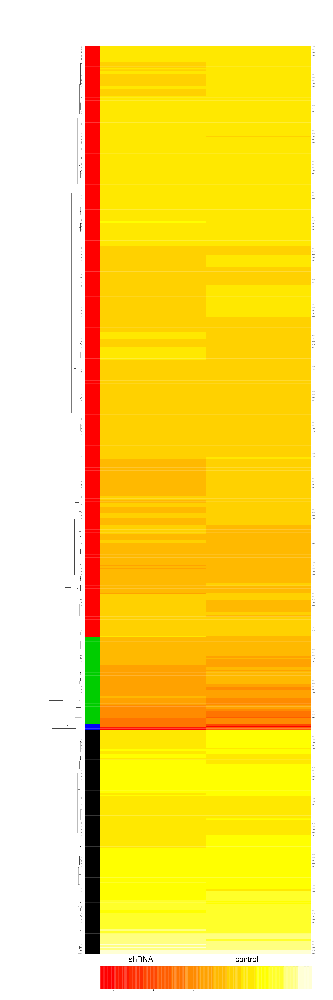

In [44]:
# with wand we can open a PDF in out screen.
# This is quite practical here as plotting the R heatmap.2 function 
# above returned an error regarding the margins and our display
# settings
print datetime.now()
from wand.image import Image as WImage
img = WImage(filename=os.path.expanduser("~")+"/work/results/figures/Figure20.pdf")
img 

In [45]:
%Rpull final_cluster
print datetime.now()
clusters=final_cluster.reset_index(inplace=False,drop=False)
clusters=clusters.sort_index(ascending=False,inplace=False)
clusters.columns=["labels","cluster"]
clusters=clusters.reset_index(inplace=False,drop=True)

clusters=pd.merge(clusters,forHeatmap_,on=["labels"],how="left")
clusters["gene_name"]=clusters["labels"].apply( lambda x: x.split("_")[0] )
clusters["gene_id"]=clusters["labels"].apply( lambda x: x.split("_")[1] )
clusters["ensembl_gene_id"]=clusters["gene_id"].apply( lambda x: x.split(".")[0])

2016-10-29 12:51:28.088151


We plot the gene expression level of each cluster separately.

2016-10-29 12:51:28.119542


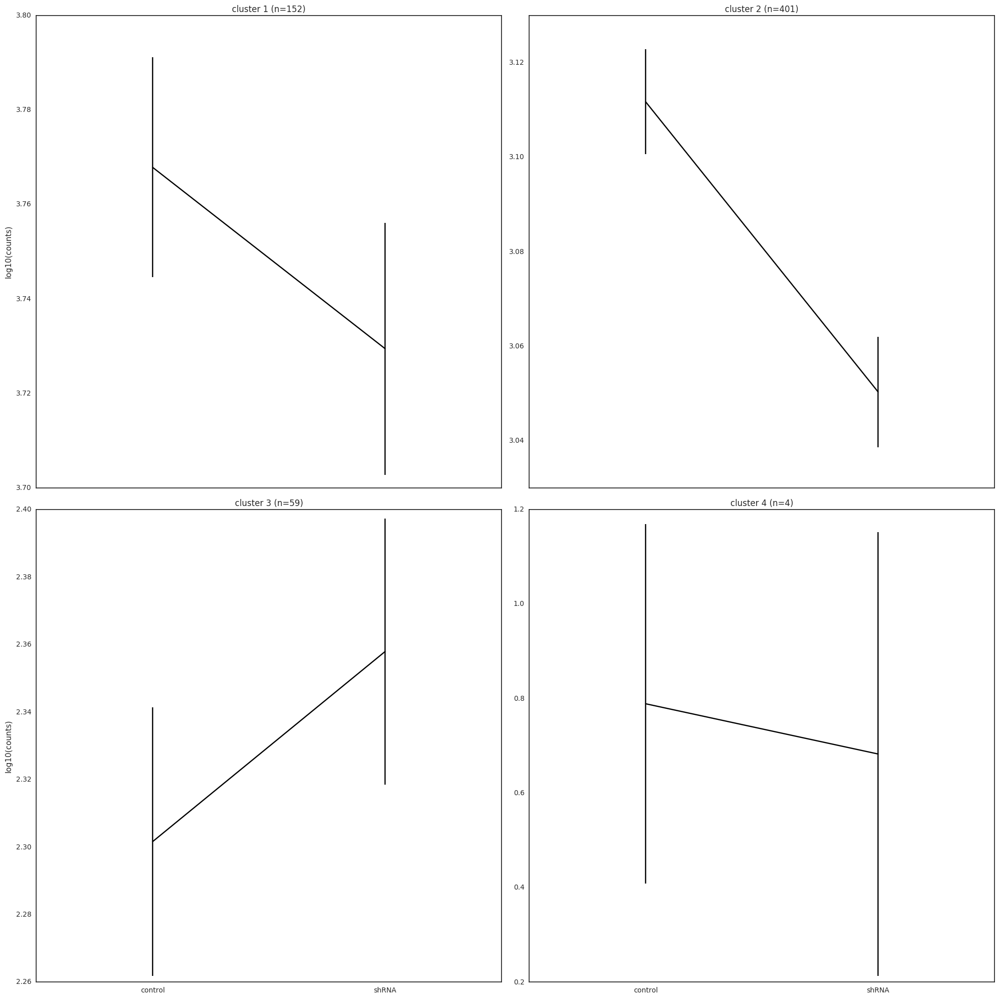

In [46]:
print datetime.now()
fig = plt.figure(figsize=(20,20))
for i in list(set(clusters["cluster"].tolist())):
    ax = fig.add_subplot(2,2,i)
    df=clusters[clusters["cluster"]==i]
    n=len(df)
    
    control=df[["control"]].mean()[0]
    shRNA=df[["shRNA"]].mean()[0]

    control_=df[["control"]].sem()[0]
    shRNA_=df[["shRNA"]].sem()[0]

    ax.set_title('cluster %s (n=%s)' %(str(i),str(n)))
    if i in [1,3]:
        ax.set_ylabel("log10(counts)")
    if i not in [3,4]:
        plt.tick_params(
            axis='x',          # changes apply to the x-axis
            which='both',      # both major and minor ticks are affected
            bottom='off',      # ticks along the bottom edge are off
            top='off',         # ticks along the top edge are off
            labelbottom='off') # labels along the bottom edge are off
    else:
        ax.set_xticklabels(["", "control","","shRNA", ""])
        plt.tick_params(
            axis='x',          # changes apply to the x-axis
            which='both',      # both major and minor ticks are affected
            bottom='off',      # ticks along the bottom edge are off
            top='off',         # ticks along the top edge are off
            labelbottom='on') # labels along the bottom edge are off
    ax.set_xlim(0.5,2.5)

    ax.errorbar( [1,2], [control, shRNA], yerr=[control_, shRNA_], fmt='-',color="black")
plt.tight_layout()
plt.savefig(outFigures+"Figure21.png",dpi=300,bbox_inches='tight', pad_inches=0.1,format='png')
plt.savefig(outFigures+"Figure21.svg",dpi=300,bbox_inches='tight', pad_inches=0.1,format='svg')
plt.show()

# 10. Writing report tables

In [47]:
print datetime.now()
clusters_=clusters[["gene_id","cluster"]]

def writeExcel(df,filename,list_of_filters,refcol,clusters_=clusters_):
    """
    Writes an excel file with the a given dataframe annotated with the cluster identifier \
    and creates sheets for each of list in the list for filters.
    
    :param df: a dataframe
    :param filename: /path/to/file.xlsx to be written
    :param list_of_filters: a list with lists of filters. Each filter containing a list of ids to filters
    :param refcol: header of the column to use when applying filters
    :param clusters_: a dataframe contatining ids and cluster n for each id
    
    :returns: nothing
    """   
    
    Exc=pd.ExcelWriter(filename)
    if refcol == "transcript_id":
        clusters_b=clusters_.copy()
        clusters_b["ensembl_gene_id"]=clusters_b["gene_id"].apply(lambda x: x.split(".")[0])
        df_=pd.merge(df,clusters_b,on=["ensembl_gene_id"],how="left")
    else:
        df_=pd.merge(df,clusters_,on=["gene_id"],how="left")
    df_.to_excel(Exc, "all",index=None)
    for l,label in zip(list_of_filters,["A","B","C","D","E","F","G"][:len(list_of_filters)]):
        tmp=df_[df_[refcol].isin(l)]
        tmp.to_excel(Exc,label,index=None)
    Exc.save()
    
    
writeExcel(dfGenesAn,outFolder+"diff.gene.expression.xlsx",[redGenesOutA,redGenesOutB,redGenesOutC,redGenesOutD,redGenesOutE],"gene_id")       
writeExcel(dfTranscriptsAn,outFolder+"diff.transcrits.expression.xlsx",[redTranscriptsOutA,redTranscriptsOutB,redTranscriptsOutC,redTranscriptsOutD,redTranscriptsOutE],"transcript_id")       
writeExcel(dfTargetsAn,outFolder+"target.genes.xlsx",[redGenesOutA,redGenesOutB,redGenesOutC,redGenesOutD,redGenesOutE],"gene_id")       

2016-10-29 12:51:33.067877


In [48]:
print datetime.now()

2016-10-29 12:52:12.340187


# 11. Enrichment analysis with DAVID

The Database for Annotation, Visualisation and Integrated Discovery is a powerful tool for the analysis of enriched GO terms in a gene set. Furthermore DAVID also allows the analysis of terms from other databases as for example: KEGG, PFAM, and OMIM. DAVID as a user friendly web frontend as well as a practical API. We here use the DAVID API to programatically analyse all our gene sets.

In [49]:
print datetime.now()

def EnrichmentsFromFile(filename,DAVIDuser,parsedGTF,refCol="ensembl_gene_id",dgeCol=None):
    """
    Performs DAVID enrichment analysis for each sheet in an excel file 
    
    :param filename: /path/to/file.xslx to analyse
    :param DAVIDuser: a registered email address in DAVID https://david.ncifcrf.gov
    :param parsedGTF: a parsed GTF with at least refcCol with the id (eg. 'ensembl_gene_id') and a 'gene_name' as retrieved from parsedGTF()
    :param refCol: the header of the column containing the identifiers
    :param dgeCol: if gene expression values area also reported in parsedGTF the header of the column should be here
    
    :returns: /path/to/generated/report.xlsx
    """
    
    ExcIN=pd.ExcelFile(filename)
    sheets=ExcIN.sheet_names
    for s in sheets:
        gene_ids=ExcIN.parse(s)
        label=s
        print s
        if s=="all":
            if os.path.basename(filename) != "target.genes.xlsx":
                gene_ids=gene_ids[gene_ids["sig"]=="yes"]
                label="sig"
        gene_ids=gene_ids["ensembl_gene_id"].tolist()
        DAVID=age.DAVIDenrich('ENSEMBL_GENE_ID',"GOTERM_BP_FAT,GOTERM_CC_FAT,GOTERM_MF_FAT,KEGG_PATHWAY,PFAM,PROSITE,GENETIC_ASSOCIATION_DB_DISEASE,OMIM_DISEASE",\
                              DAVIDuser,gene_ids)
        if type(DAVID) != type(None):
            print "Curating DAVID for file %s, sheet %s" %(filename,label)
            sys.stdout.flush()
            DAVID["genes_names"]=DAVID["geneIds"].apply(lambda x: age.DAVIDgetGeneAttribute(x,parsedGTF,refCol=refCol))
            if dgeCol:
                DAVID["genes_log2FC"]=DAVID["geneIds"].apply(lambda x: age.DAVIDgetGeneAttribute(x,parsedGTF,refCol=refCol,fieldTOretrieve=dgeCol)) 
            filenameOUT=os.path.dirname(filename)+"/"+os.path.basename(filename).split("xlsx")[0]+"DAVID."+label+".xlsx"
            ExcOUT=pd.ExcelWriter(filenameOUT)
            for c in list(set(DAVID["categoryName"].tolist())):
                DAVID_=DAVID[DAVID["categoryName"]==c]
                DAVID_.to_excel(ExcOUT, c,index=None)
            ExcOUT.save()
    return filenameOUT
    
fixGTF=parsedGTF[["gene_id","gene_name"]]
fixGTF["ensembl_gene_id"]=fixGTF["gene_id"].apply(lambda x: x.split(".")[0])
fixGTF=fixGTF[["ensembl_gene_id","gene_name"]]
for f in ["diff.gene.expression.xlsx","diff.transcrits.expression.xlsx","target.genes.xlsx"]:
    res=EnrichmentsFromFile(outFolder+f,DAVIDuser=DAVIDuser,parsedGTF=fixGTF)


2016-10-29 12:52:12.413594


/opt/conda/envs/ipykernel_py2/lib/python2.7/site-packages/ipykernel/__main__.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


all
Curating DAVID for file /home/jovyan/work/results/diff.gene.expression.xlsx, sheet sig
A
Curating DAVID for file /home/jovyan/work/results/diff.gene.expression.xlsx, sheet A
B
Curating DAVID for file /home/jovyan/work/results/diff.gene.expression.xlsx, sheet B
C
Curating DAVID for file /home/jovyan/work/results/diff.gene.expression.xlsx, sheet C
D
Curating DAVID for file /home/jovyan/work/results/diff.gene.expression.xlsx, sheet D
E
Curating DAVID for file /home/jovyan/work/results/diff.gene.expression.xlsx, sheet E
all
Curating DAVID for file /home/jovyan/work/results/diff.transcrits.expression.xlsx, sheet sig
A
Curating DAVID for file /home/jovyan/work/results/diff.transcrits.expression.xlsx, sheet A
B
Curating DAVID for file /home/jovyan/work/results/diff.transcrits.expression.xlsx, sheet B
C
Curating DAVID for file /home/jovyan/work/results/diff.transcrits.expression.xlsx, sheet C
D
Curating DAVID for file /home/jovyan/work/results/diff.transcrits.expression.xlsx, sheet D
E
Cur

In [50]:
print datetime.now()
for i in list(set(clusters["cluster"].tolist())):
    ENSEMBL_GENE_IDs=clusters[clusters["cluster"]==i]["ensembl_gene_id"].tolist()
    writer = pd.ExcelWriter(outFolder+"cluster_%s_NoBackCorrection.xlsx" %str(i))
    dfGenesAn[dfGenesAn["ensembl_gene_id"].isin(ENSEMBL_GENE_IDs)].to_excel(writer,"genes",index=False)
    DAVID=age.DAVIDenrich('ENSEMBL_GENE_ID',"GOTERM_BP_FAT,GOTERM_CC_FAT,GOTERM_MF_FAT,KEGG_PATHWAY,PFAM,PROSITE,GENETIC_ASSOCIATION_DB_DISEASE,OMIM_DISEASE",\
                   DAVIDuser,ENSEMBL_GENE_IDs)
    if type(DAVID) != type(None):
        DAVID["genes_names"]=DAVID["geneIds"].apply(lambda x: age.DAVIDgetGeneAttribute(x,fixGTF))
        for c in list(set(DAVID["categoryName"].tolist())):
            DAVID_=DAVID[DAVID["categoryName"]==c]
            DAVID_.to_excel(writer,c,index=False)
    writer.save()

2016-10-29 13:52:02.495357


In [51]:
print datetime.now()
ids_bg=clusters["ensembl_gene_id"].tolist()
for i in list(set(clusters["cluster"].tolist())):
    ENSEMBL_GENE_IDs=clusters[clusters["cluster"]==i]["ensembl_gene_id"].tolist()
    writer = pd.ExcelWriter(outFolder+"cluster_%s_BackCorrection.xlsx" %str(i))
    dfGenesAn[dfGenesAn["ensembl_gene_id"].isin(ENSEMBL_GENE_IDs)].to_excel(writer,"genes",index=False)
    DAVID=age.DAVIDenrich('ENSEMBL_GENE_ID',"GOTERM_BP_FAT,GOTERM_CC_FAT,GOTERM_MF_FAT,KEGG_PATHWAY,PFAM,PROSITE,GENETIC_ASSOCIATION_DB_DISEASE,OMIM_DISEASE",\
                   DAVIDuser,ENSEMBL_GENE_IDs,ids_bg=ids_bg)
    if type(DAVID) != type(None):
        DAVID["genes_names"]=DAVID["geneIds"].apply(lambda x: age.DAVIDgetGeneAttribute(x,fixGTF))
        for c in list(set(DAVID["categoryName"].tolist())):
            DAVID_=DAVID[DAVID["categoryName"]==c]
            DAVID_.to_excel(writer,c,index=False)
    writer.save()

2016-10-29 13:58:14.286432


# 12. Generating MOTIFs with MEME

With the plots above demonstrating a bias in eCLIP towards higher levels of expression of targets for the identification of KHSRP targets we use the peaks identified by eCLIP to generate a KHSRP target motif consensus. We will later run this motif through all human transcripts to identify target transcripts in an unbiased way.

We here use meme-cip, part of the MEME suite. For eCLIP, meme-chip  requires 100 bases sequences centred on the peak centre.

In [52]:
print datetime.now()
cols=dfTargetsAn.columns.tolist()[:10]
dfTargetsBED=dfTargetsAn[cols].drop_duplicates()
dfTargetsBED.reset_index(inplace=True, drop=True)

dfTargetsBED["center"]=dfTargetsBED[["chromStart","chromEnd"]].mean(axis=1)
dfTargetsBED["center"]=dfTargetsBED["center"].astype(int)
dfTargetsBED["chromStart"]=dfTargetsBED["center"]-50
dfTargetsBED["chromEnd"]=dfTargetsBED["center"]+50

for i in ["chromStart","chromEnd"]:
    dfTargetsBED[i]=dfTargetsBED[i].astype(int)

dfTargetsBED=dfTargetsBED.drop(["center"],axis=1)

2016-10-29 14:00:18.452621


In [53]:
print datetime.now()
dfTargetsBED=dfTargetsBED.sort_values(by=["chrom","chromStart","chromEnd"])
dfTargetsBED.reset_index(inplace=True, drop=True)
age.writeBED(dfTargetsBED, outFolder+"/targets.bed")

2016-10-29 14:00:18.548756


In [54]:
print datetime.now()

2016-10-29 14:00:18.597838


Having generated the BED file with the regions of interest for definition of the target peak we use ```bedtools getfasta``` to extract the respective sequences from the reference genome fasta file in a stranded specific fashion.

As we deal with RNA and not DNA we convert all "T"s to "U"s with ```sed```
. Otherwise, meme-chip might start looking for motifs on the reverse strand as well. 

In [55]:
%%bash
cd ~/work/results/rsem-results
samtools faidx genome.fa
bedtools getfasta -s -name -fi ~/work/results/rsem-results/genome.fa -bed ~/work/results/targets.bed -fo ~/work/results/targets.fa

In [56]:
print datetime.now()

2016-10-29 14:00:40.624606


In [57]:
%%bash
cd ~/work/results/
sed '/^>/! y/tT/uU/' < targets.fa > targets.rna.fa
meme-chip -oc meme-chip_output -rna -db ~/software/motif_databases/RNA/Ray2013_rbp_All_Species.meme targets.rna.fa     

Starting getsize: getsize meme-chip_output/targets.rna.fa 1> $metrics
getsize ran successfully in 0.019052 seconds
Starting fasta-most: fasta-most -min 50 < meme-chip_output/targets.rna.fa 1> $metrics
fasta-most ran successfully in 0.063601 seconds
Starting fasta-center: fasta-center -rna -len 100 < meme-chip_output/targets.rna.fa 1> meme-chip_output/seqs-centered
fasta-center ran successfully in 0.102547 seconds
Starting fasta-shuffle-letters: fasta-shuffle-letters meme-chip_output/seqs-centered meme-chip_output/seqs-shuffled -kmer 2 -tag -dinuc -rna -seed 1
fasta-shuffle-letters ran successfully in 0.062935 seconds
Starting fasta-subsample: fasta-subsample meme-chip_output/seqs-centered 600 -rest meme-chip_output/seqs-discarded -seed 1 1> meme-chip_output/seqs-sampled
fasta-subsample ran successfully in 0.124387 seconds
Starting fasta-get-markov: fasta-get-markov -nostatus -nosummary -rna -m 1 meme-chip_output/targets.rna.fa meme-chip_output/background
fasta-get-markov ran successful

Log::Log4perl configuration looks suspicious: No loggers defined at /usr/local/share/perl/5.20.2/Log/Log4perl/Config.pm line 322.


Before defining a motif as useful for identifying targets on a transcriptome wide scale we define a motif as valid if the number of sites it encounters during meme-chip is equal or bigger then 5% of the number of given sites used for the generation of the motif.

In [58]:
print datetime.now()
minSites=len(dfTargetsBED)*0.05
newMOTIFS=age.filterMotifs(outFolder+"meme-chip_output/combined.meme",outFolder+"user.selected.meme",minSites=minSites)

2016-10-29 14:12:11.981090
MOTIF 0  1746
MOTIF 1  3120
MOTIF 2  20
MOTIF 3  30
MOTIF 4  1965
MOTIF 5  20
MOTIF 6  20
MOTIF 7  20
MOTIF 8  3
MOTIF 9  20
MOTIF 10  20
MOTIF 11  20
MOTIF 12  20
MOTIF 13  7
MOTIF 14  20
MOTIF 15  244
MOTIF 16  20
MOTIF 17  20
MOTIF 18  20
MOTIF 19  20
MOTIF 20  20
MOTIF 21  421
MOTIF 22  20
MOTIF 23  1715
MOTIF 24  1311
MOTIF 25  20
MOTIF 26  20
MOTIF 27  1781
MOTIF 28  20
MOTIF 29  20
MOTIF 30  33
MOTIF 31  20
MOTIF 32  20
MOTIF 33  20
MOTIF 34  232
MOTIF 35  360
MOTIF 36  20
MOTIF 37  20
MOTIF 38  20
MOTIF 39  20
MOTIF 40  20
MOTIF 41  20
MOTIF 42  45
MOTIF 43  20
MOTIF 44  20
MOTIF 45  20
MOTIF 46  93
MOTIF 47  20
MOTIF 48  94
MOTIF 49  20
MOTIF 50  20
MOTIF 51  48
MOTIF 52  20
MOTIF 53  36
MOTIF 54  20
MOTIF 55  20
MOTIF 56  20


In [59]:
print datetime.now()

2016-10-29 14:12:12.043453


# 13. Identifying target transcripts using MEME

We start by extracting the fasta sequences of each transcript using ```gffread```, the annotation.gft file as well as the genome.fa file.

As before, we convert all T to U.

Finally we run fimo to scan the transcriptome for the presence of our selected motifs.

In [60]:
%%bash
cd ~/work/results
gffread -w transcripts.fa -g rsem-results/genome.fa rsem-results/annotation.gtf
sed '/^>/! y/tT/uU/' < transcripts.fa > transcripts.rna.fa
fimo --norc --text user.selected.meme transcripts.rna.fa > fimo.output.tsv

Using motif 0 of width 6.
Using motif 1 of width 5.
Using motif 4 of width 6.
Using motif 15 of width 8.
Using motif 21 of width 7.
Using motif 23 of width 5.
Using motif 24 of width 5.
Using motif 27 of width 5.
Using motif 34 of width 7.
Using motif 35 of width 5.


In [61]:
print datetime.now()
dfFimo=pd.read_table(outFolder+"fimo.output.tsv")
FimoTranscripts=list(set(dfFimo["sequence name"].tolist())) 
allt=list(set(dfTargetsAn["transcript_id"].tolist()))

print "Number of fimo detected transcripts:", len(FimoTranscripts)
print "Number of transcripts associated with sequences submited to MEME-ChIP:", len(allt)
print "Number of transcripts in organism:", len(list(set(parsedGTF["transcript_id"].tolist())))
print "Number of transcripts associated with sequences submited to MEME-ChIP\nwhich are also detected by FIMO:", len([ s for s in FimoTranscripts if s in allt ])

FimoGenes=list(set(parsedGTF[parsedGTF["transcript_id"].isin(FimoTranscripts)]["gene_id"].tolist()))
alltGenes=list(set(parsedGTF[parsedGTF["transcript_id"].isin(allt)]["gene_id"].tolist())) 

print "\n"
print "Number of fimo detected genes:", len(FimoGenes )
print "Number of genes associated with sequences submited to MEME-ChIP:", len(alltGenes)
print "Number of genes in organism:", len(list(set(parsedGTF["gene_id"].tolist())))
print "Number of genes associated with sequences submited to MEME-ChIP\nwhich are also detected by FIMO:", len([ s for s in FimoGenes if s in alltGenes ])


2016-10-29 14:17:35.131895
Number of fimo detected transcripts: 60257
Number of transcripts associated with sequences submited to MEME-ChIP: 3436
Number of transcripts in organism: 199349
Number of transcripts associated with sequences submited to MEME-ChIP
which are also detected by FIMO: 2238


Number of fimo detected genes: 22917
Number of genes associated with sequences submited to MEME-ChIP: 1465
Number of genes in organism: 60725
Number of genes associated with sequences submited to MEME-ChIP
which are also detected by FIMO: 1271


In [62]:
print datetime.now()
TargetT_=FimoTranscripts
TargetG_=list(set(parsedGTF[parsedGTF["transcript_id"].isin(TargetT_)]["gene_id"].tolist())) 

2016-10-29 14:17:41.517889


# 14. Merging MEME identified targets and DGE

As before, we visualise the final result of MEME combined with our differential gene expression results.

2016-10-29 14:17:41.953274


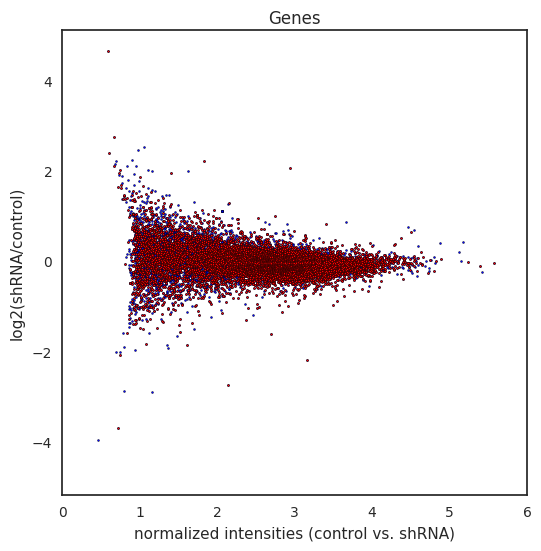

(B_FIMO) red, RBP target genes


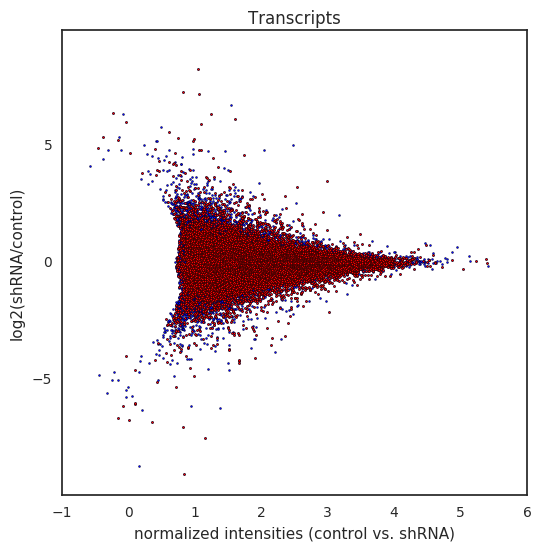

(B_FIMO) red, RBP target transcripts


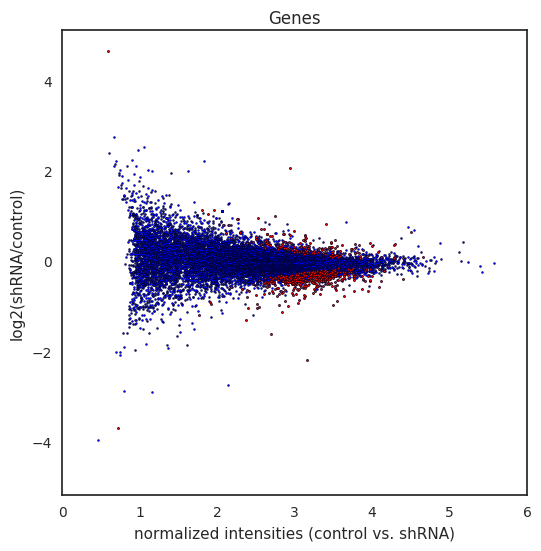

(C_FIMO) red, significantly changed RBP target genes


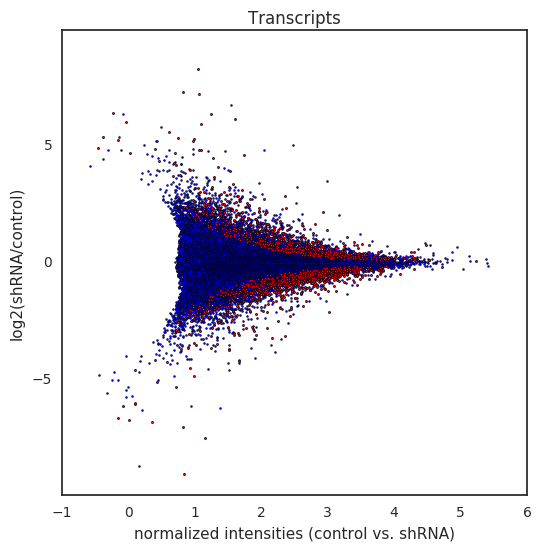

(C_FIMO) red, significantly changed RBP target transcripts


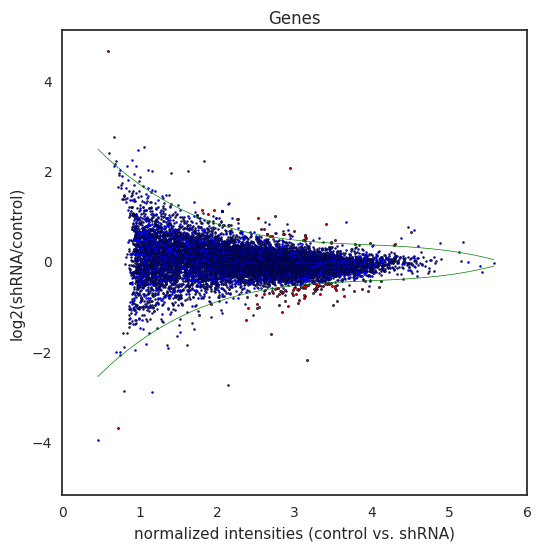

(D_FIMO) red, significantly changed RBP target genes out of the 0.5 percentil


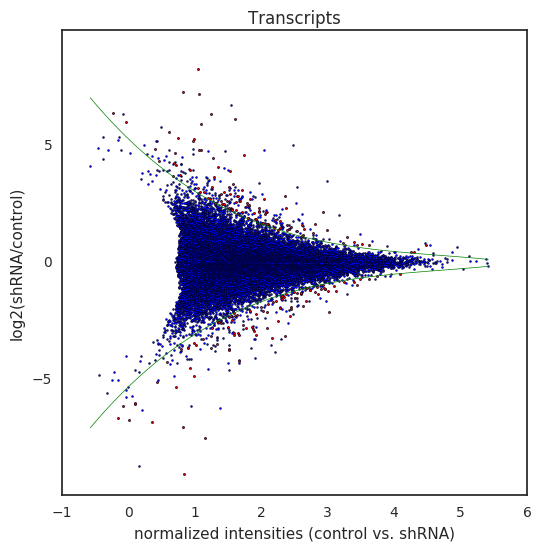

(D_FIMO) red, significantly changed RBP target transcript out of the 0.5 percentil


In [63]:
print datetime.now()
dfGenesWoutB_,redGenesOutB_=age.MA(dfGenes,'Genes',outFigures+'Figure22',list_of_comparisons,spec=TargetG_,splines=False,sizeRed=2)
print "(B_FIMO) red, RBP target genes"
sys.stdout.flush()

dfTranscritpsWoutB_,redTranscriptsOutB_=age.MA(dfTranscripts,'Transcripts',outFigures+'Figure23',list_of_comparisons,spec=TargetT_, splines=False,sizeRed=2)
print "(B_FIMO) red, RBP target transcripts"
sys.stdout.flush()

TargetG_dif_=[ s for s in TargetG_ if s in sigGenes ]
TargetT_dif_=[ s for s in TargetT_ if s in sigTranscripts ]

dfGenesWoutC_,redGenesOutC_=age.MA(dfGenes,'Genes',outFigures+'Figure24',list_of_comparisons,spec=TargetG_dif_,splines=False,sizeRed=2)
print "(C_FIMO) red, significantly changed RBP target genes"
sys.stdout.flush()

dfTranscritpsWoutC_,redTranscriptsOutC_=age.MA(dfTranscripts,'Transcripts',outFigures+'Figure25',list_of_comparisons,spec=TargetT_dif_,splines=False,sizeRed=2)
print "(C_FIMO) red, significantly changed RBP target transcripts"
sys.stdout.flush()

dfGenesWoutD_,redGenesOutD_=age.MA(dfGenes,'Genes',outFigures+'Figure26',list_of_comparisons,Targets=TargetG_dif_,sizeRed=2)
print "(D_FIMO) red, significantly changed RBP target genes out of the 0.5 percentil"
sys.stdout.flush()

dfTranscritpsWoutD_,redTranscriptsOutD_=age.MA(dfTranscripts,'Transcripts',outFigures+'Figure27',list_of_comparisons,Targets=TargetT_dif_,sizeRed=2)
print "(D_FIMO) red, significantly changed RBP target transcript out of the 0.5 percentil"
sys.stdout.flush()


2016-10-29 14:18:37.135485


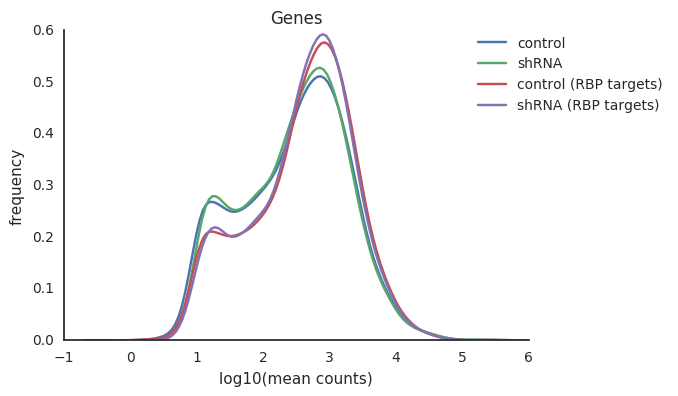

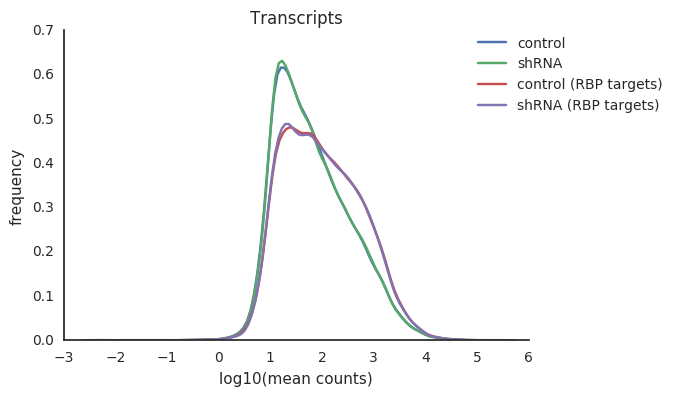

In [64]:
print datetime.now()
plotKDE(dfGenes,'Genes',outFigures+'Figure28',TargetG_)
plotKDE(dfTranscripts,'Transcripts',outFigures+'Figure29',TargetT_)

We annotate our table of MEME identified targets, save the respective report tables, and use DAVID for enrichment analysis.

In [65]:
print datetime.now()

dfFimo_=dfFimo.copy()
dfFimo_["transcript_id"]=dfFimo_["sequence name"]
dfFimo_=dfFimo_.drop(["sequence name"],axis=1)
dfFimoAnn=AnnotateDF(dfFimo_,"transcript_id")

FIMO_OUT=outFolder+"FIMO_filtered/"
if not os.path.exists(FIMO_OUT):
    os.makedirs(FIMO_OUT)
    
writeExcel(dfGenesAn,FIMO_OUT+"diff.gene.expression.xlsx",[redGenesOutA,redGenesOutB_,redGenesOutC_,redGenesOutD_,],"gene_id")       
writeExcel(dfTranscriptsAn,FIMO_OUT+"diff.transcrits.expression.xlsx",[redTranscriptsOutA,redTranscriptsOutB_,redTranscriptsOutC_,redTranscriptsOutD_,],"transcript_id")       
writeExcel(dfFimoAnn,FIMO_OUT+"target.genes.xlsx",[redGenesOutA,redGenesOutB_,redGenesOutC_,redGenesOutD_,],"gene_id")       

for f in ["diff.gene.expression.xlsx","diff.transcrits.expression.xlsx","target.genes.xlsx"]:
    res=EnrichmentsFromFile(FIMO_OUT+f,DAVIDuser=DAVIDuser,parsedGTF=fixGTF)

2016-10-29 14:18:38.889488
all
Curating DAVID for file /home/jovyan/work/results/FIMO_filtered/diff.gene.expression.xlsx, sheet sig
A
Curating DAVID for file /home/jovyan/work/results/FIMO_filtered/diff.gene.expression.xlsx, sheet A
B
Curating DAVID for file /home/jovyan/work/results/FIMO_filtered/diff.gene.expression.xlsx, sheet B
C
Curating DAVID for file /home/jovyan/work/results/FIMO_filtered/diff.gene.expression.xlsx, sheet C
D
Curating DAVID for file /home/jovyan/work/results/FIMO_filtered/diff.gene.expression.xlsx, sheet D
all
Curating DAVID for file /home/jovyan/work/results/FIMO_filtered/diff.transcrits.expression.xlsx, sheet sig
A
Curating DAVID for file /home/jovyan/work/results/FIMO_filtered/diff.transcrits.expression.xlsx, sheet A
B
Curating DAVID for file /home/jovyan/work/results/FIMO_filtered/diff.transcrits.expression.xlsx, sheet B
C
Curating DAVID for file /home/jovyan/work/results/FIMO_filtered/diff.transcrits.expression.xlsx, sheet C
D
Curating DAVID for file /home/

# 15. Calculating distance between target sites and stop codons

KHSRP has been previously shown to be a key mediator of mRNA decay through the interaction with AU-rich-elements in target mRNAs [[ref](http://www.nature.com/nature/journal/v459/n7249/abs/nature08025.html)].

Given this report we expect KHSRP target sites to be located in the 3'UTR of respective target mRNAs. We therefore calculated the distance between each target site and the stop codon of each respective target gene.

We start by creating a dictionary where for each transcript all exon positions are present eg. dic=
{"ESNT00001":[1001,1002,1003,...6023,6024,6025], "ESNT00001":[3301,3302,3303,...5042,5043,5044]}. It is important to notice that for transcripts encoded in the "-" strand, the positions of each exon need to be reverse sorted.

Having created this dictionary we can used to identify the position of each genomic coordinate on the transcript. 

eg. Using the dictionary above we can see that position 1003 of "ESNT00001" is the 3rd position in the transcript.

Having translated all genomic coordinates of target sites and stop codons to transcript coordinates we plot the distribution of the distances between both.

In [66]:
print datetime.now()
GTFforMAP=parsedGTF[['seqname','feature','start','end','strand','frame','gene_id','transcript_id','exon_id','exon_number']]
GenTransMapDic=age.MAPGenoToTrans(GTFforMAP,"exon")

2016-10-29 16:27:26.024323


/home/jovyan/AGEpy/AGEpy/AGEpy.py:2043: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  GenTransMap["feature_bases"]=GenTransMap.apply(getExonsPositions, axis=1)


In [67]:
print datetime.now()
stop_codons=parsedGTF[parsedGTF["feature"]=="stop_codon"][["start","end","transcript_id","strand"]]
stop_codons["mean"]=stop_codons[["start","end"]].mean(axis=1)
stop_codons=stop_codons[["transcript_id","mean","strand"]]
stop_codons["transcript_stop"]=stop_codons.apply(age.GetTransPosition,args=("mean",GenTransMapDic,),axis=1)
stop_codons=stop_codons[["transcript_id","transcript_stop","strand"]]

dfTargetsTrans=dfTargets[["chromStart","chromEnd","name","transcript_id"]].drop_duplicates().dropna()
dfTargetsTrans["mean"]=dfTargetsTrans[["chromStart","chromEnd"]].mean(axis=1)
dfTargetsTrans["transcript_target"]=dfTargetsTrans.apply(age.GetTransPosition,args=("mean",GenTransMapDic,),axis=1)
dfTargetsTrans=dfTargetsTrans[["transcript_id","transcript_target"]].dropna()
dfTargetsTrans=pd.merge(dfTargetsTrans,stop_codons,on=["transcript_id"])
dfTargetsTrans["dist"]=dfTargetsTrans["transcript_target"]-dfTargetsTrans["transcript_stop"]

dfTargetsFIMO=dfFimo.copy()
dfTargetsFIMO["transcript_target"]=dfTargetsFIMO[["start","stop"]].mean(axis=1)
dfTargetsFIMO=dfTargetsFIMO[["sequence name","transcript_target"]].drop_duplicates()
dfTargetsFIMO.columns=["transcript_id","transcript_target"]
dfTargetsFIMO=pd.merge(dfTargetsFIMO,stop_codons,on=["transcript_id"])
dfTargetsFIMO["dist"]=dfTargetsFIMO["transcript_target"]-dfTargetsFIMO["transcript_stop"] 

2016-10-29 16:30:22.328757


2016-10-29 16:30:45.014803


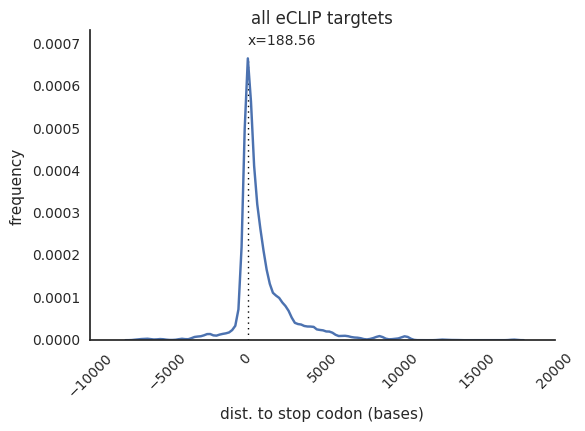

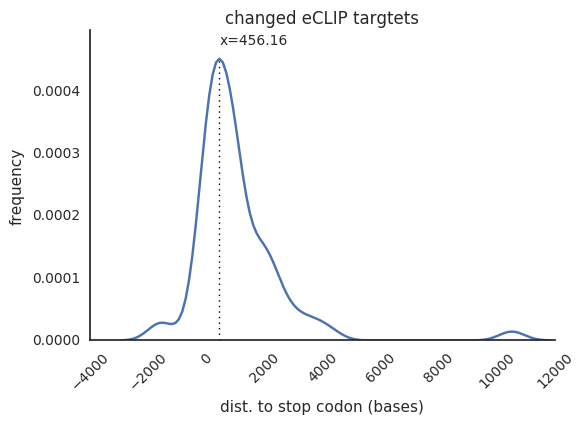

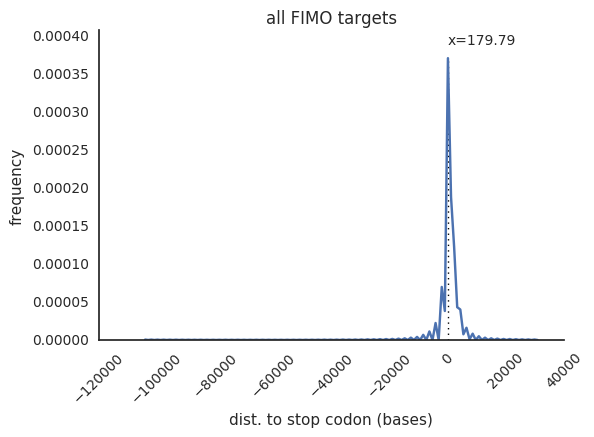

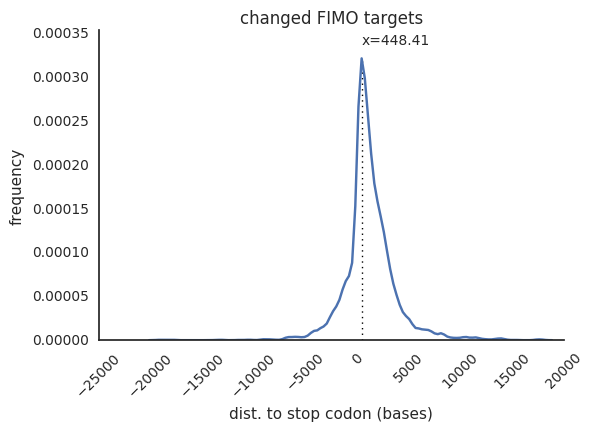

In [68]:
print datetime.now()
def plotDIST(df,title,figName,cum=False,per=0.05,xlim=None):
    """
    Plots the distribution of the distances in a dataframe
    
    :param df: a Pandas dataframe with the column 'dist'
    :param title: plot title
    :param figName: /path/to/saved/figure/prefix
    :param cum: plot the cumulative plot instead 
    :param per: if 'cum=True' choose the percentil to mark
    :param xlim: list with [lower,upper] x limits for the plot
    
    :returns: nothing 
    """

    sns.set_style("white")
    p=sns.kdeplot( df["dist"],cumulative=cum)
    x,y = p.get_lines()[0].get_data()
    
    if not cum:
        y_=list(y).index(max(list(y)))
        plt.vlines(x[y_],0,y[y_],linestyles='dotted',lw=1)
        plt.ylabel("frequency")
        plt.annotate("x=%s" %str(np.around(x[y_],2)) , xy=(x[y_]*1.05, y[y_]*1.05))#xycoords='figure points')
        plt.ylim(0,y[y_]*1.1)
    else:
        y_max=len([s for s in y if s < (1.00-per)])
        y_min=len([s for s in y if s < per])
        x_max=x[y_max-1]
        x_min=x[y_min-1]
        plt.vlines(x_min,0,y[y_min-1],linestyles='dotted',lw=1)
        plt.vlines(x_max,0,y[y_max-1],linestyles='dotted',lw=1)
        plt.ylabel("cumulative")
        
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.xlabel("dist. to stop codon (bases)")

    plt.title(title)
    plt.xticks(rotation=45)
    plt.gca().legend().set_visible(False)
    if xlim:
        plt.xlim(xlim[0],xlim[1])
    plt.savefig(figName+".png",dpi=300,bbox_inches='tight', pad_inches=0.1,format='png')
    plt.savefig(figName+".svg",dpi=300,bbox_inches='tight', pad_inches=0.1,format='svg')
    plt.show()
    if cum:
        return x_min, x_max, (x,y)
    else:
        return x,y

x_exp,y_exp=plotDIST(dfTargetsTrans,"all eCLIP targtets",outFigures+'Figure30')
x_cha,y_cha=plotDIST(dfTargetsTrans[dfTargetsTrans["transcript_id"].isin(redTranscriptsOutA)],"changed eCLIP targtets",outFigures+'Figure31')
x_FIMO,y_FIMO=plotDIST(dfTargetsFIMO,"all FIMO targets",outFigures+'Figure32')
x_FIMO_cha,y_FIMO_cha=plotDIST(dfTargetsFIMO[dfTargetsFIMO["transcript_id"].isin(sigTranscripts)],"changed FIMO targets",outFigures+'Figure33')

# 16. Filtering terms of interest from enrichment tables

We have previously shown that Khsrp is regulated in response to genotoxic stress.
We therefore searched for any "Biological process" enriched term in all DAVID "Biological process" outputs which contains at least one of the strings "cell cycle","apoptosis","cell death","cell division", or "proliferation".

2016-10-29 16:30:47.948926


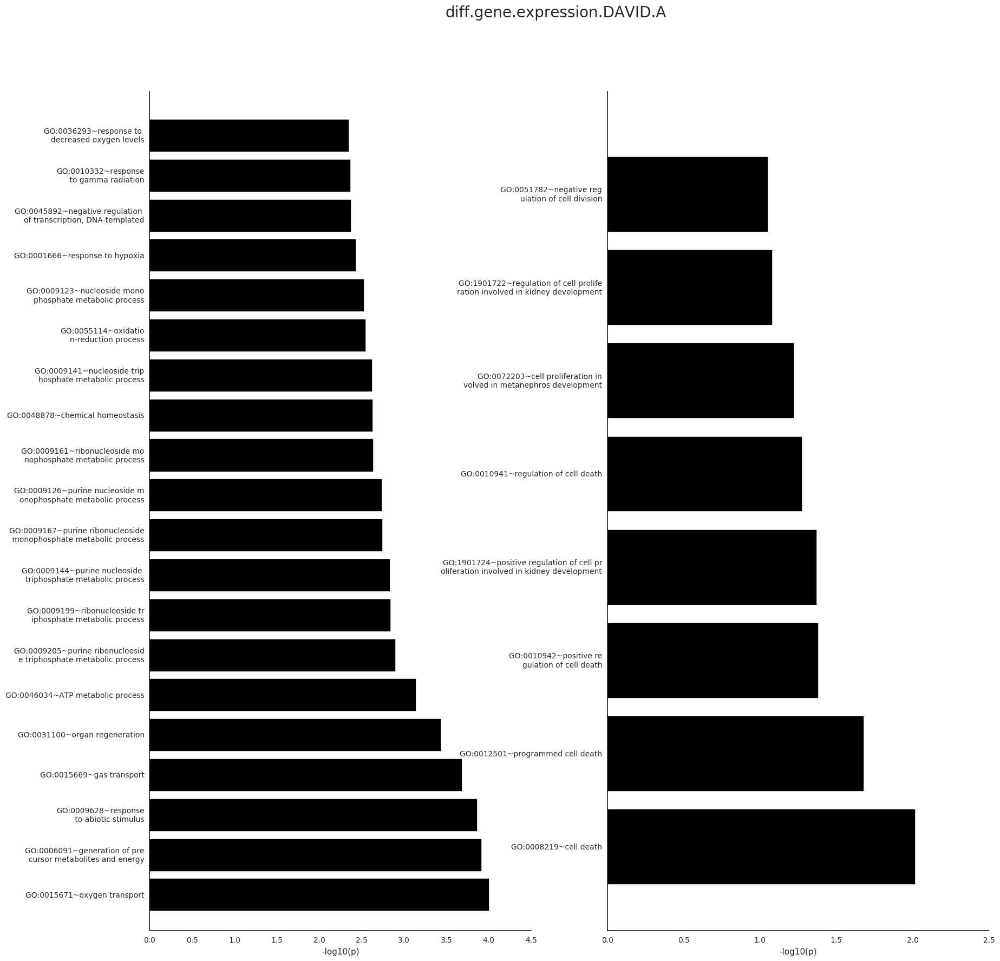

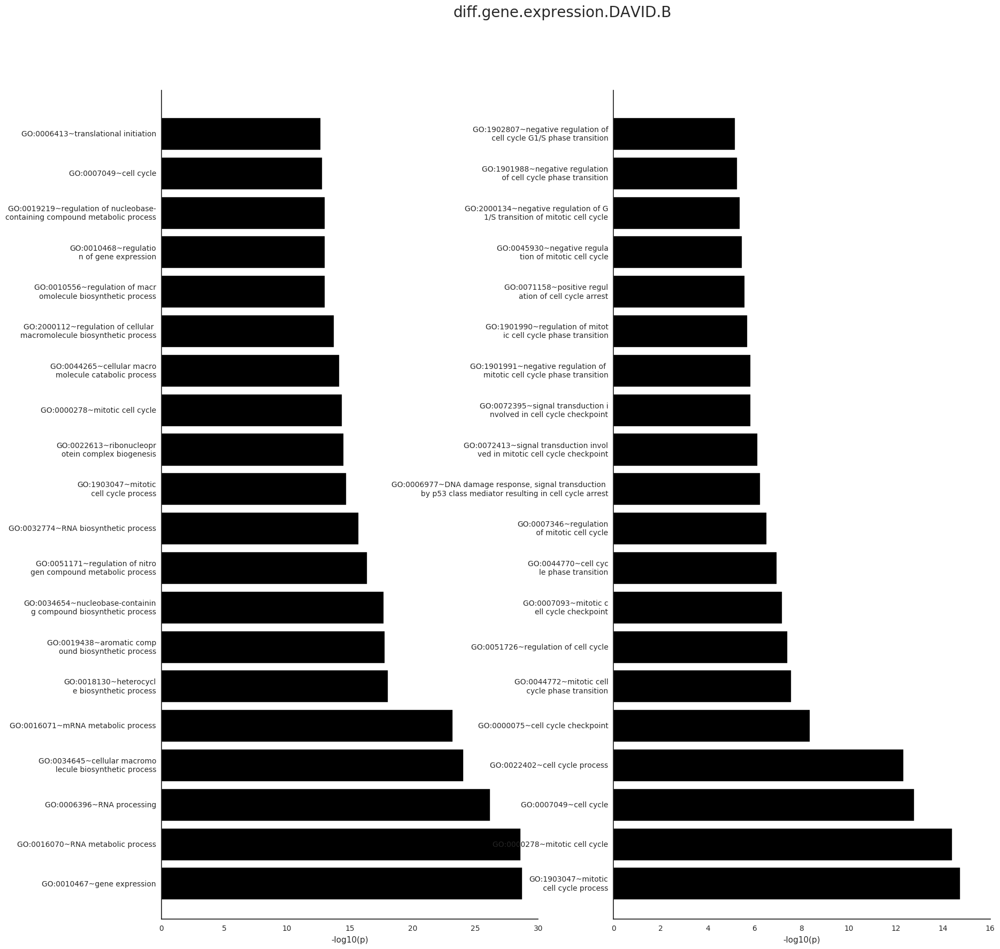

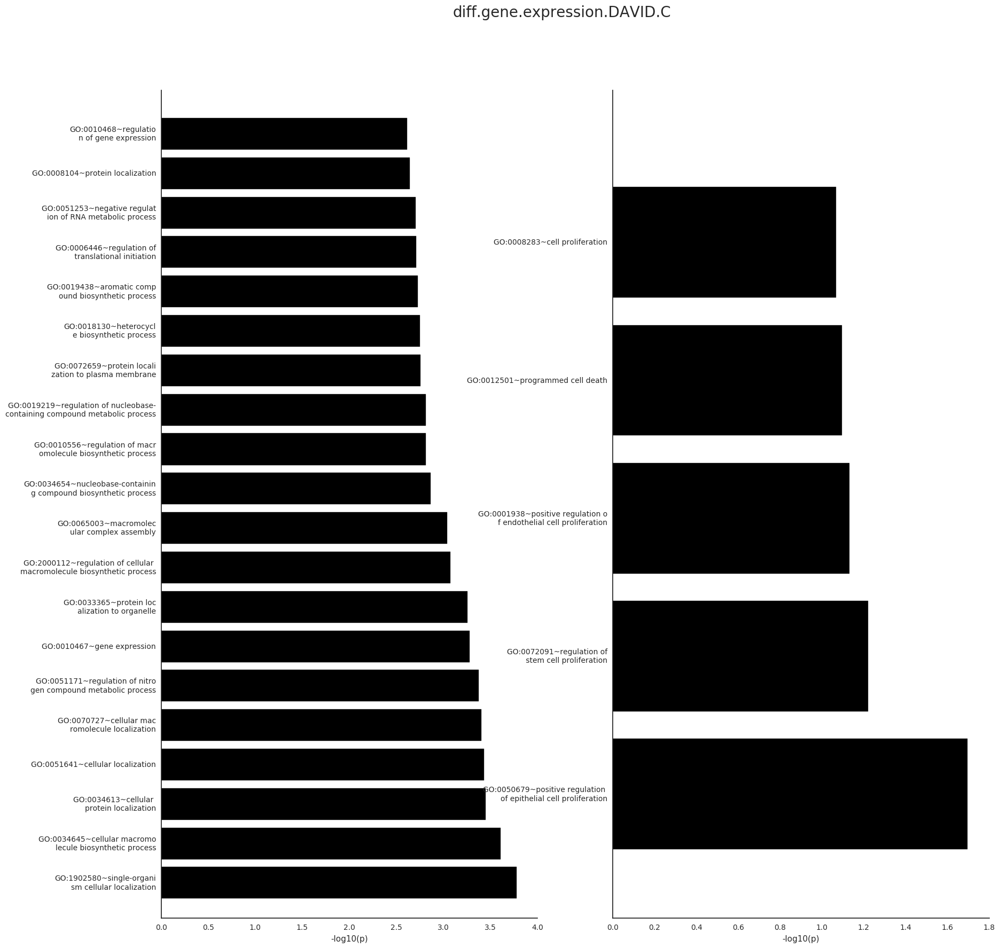

diff.gene.expression.DAVID.D.xlsx


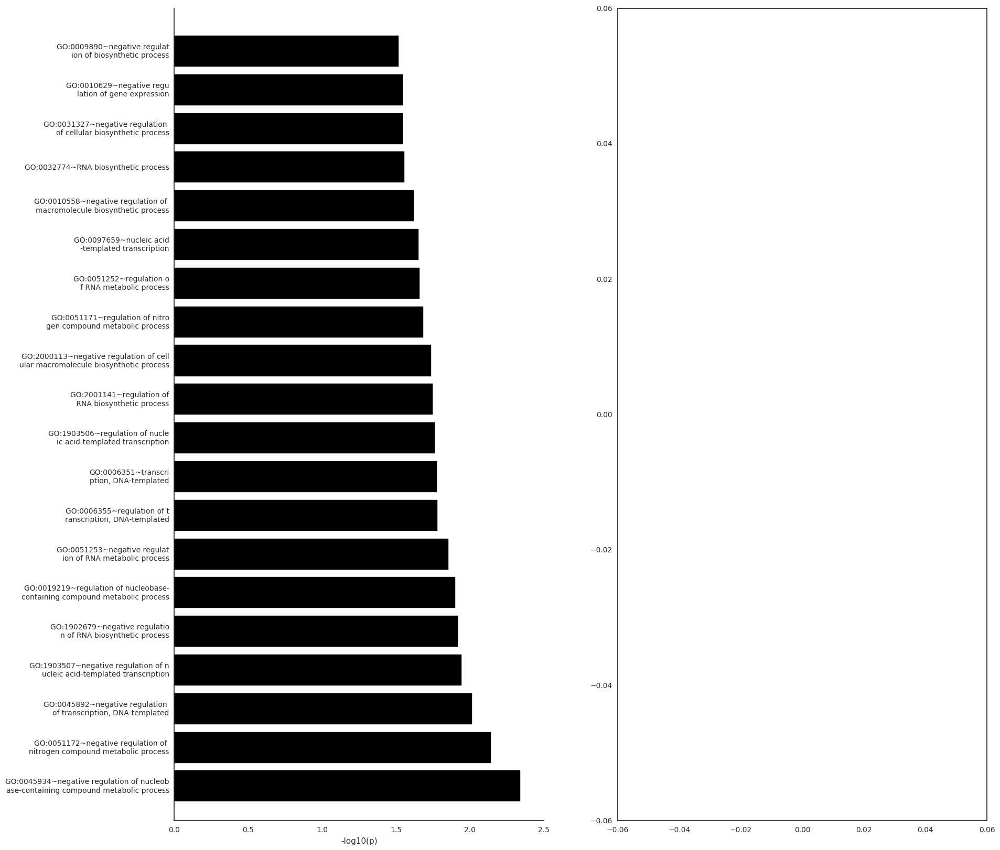

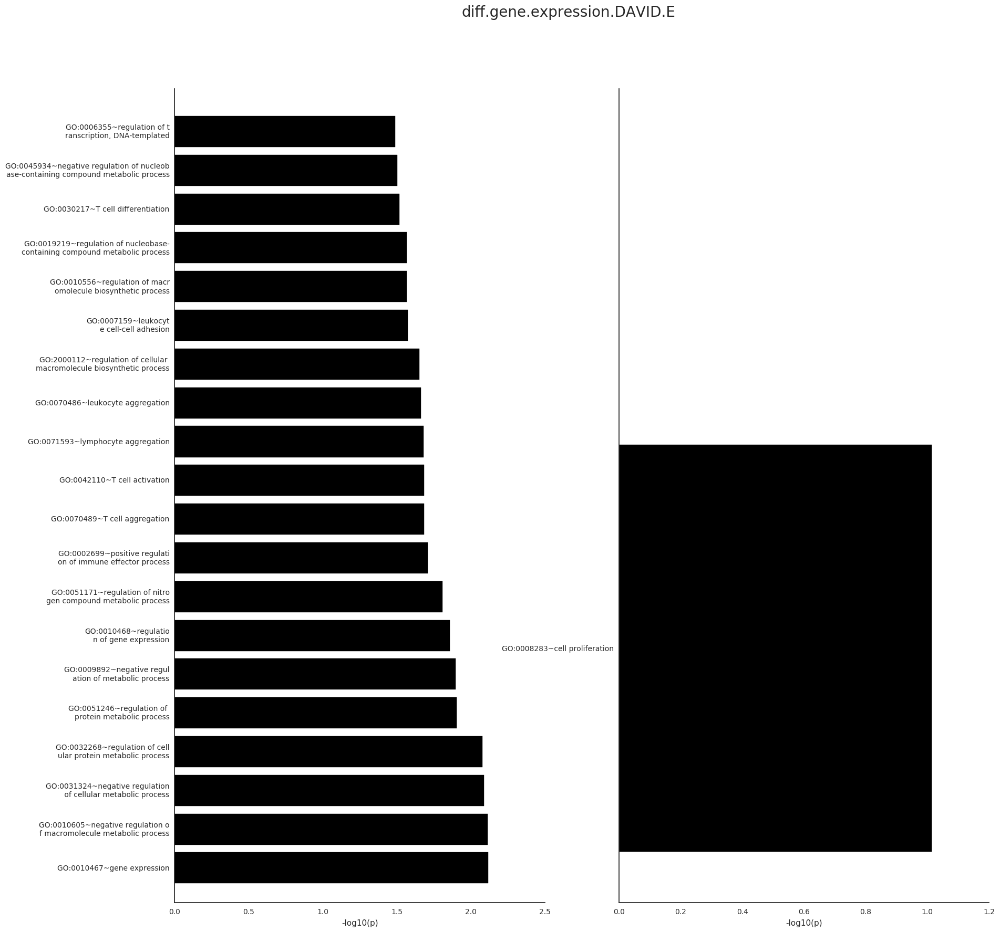

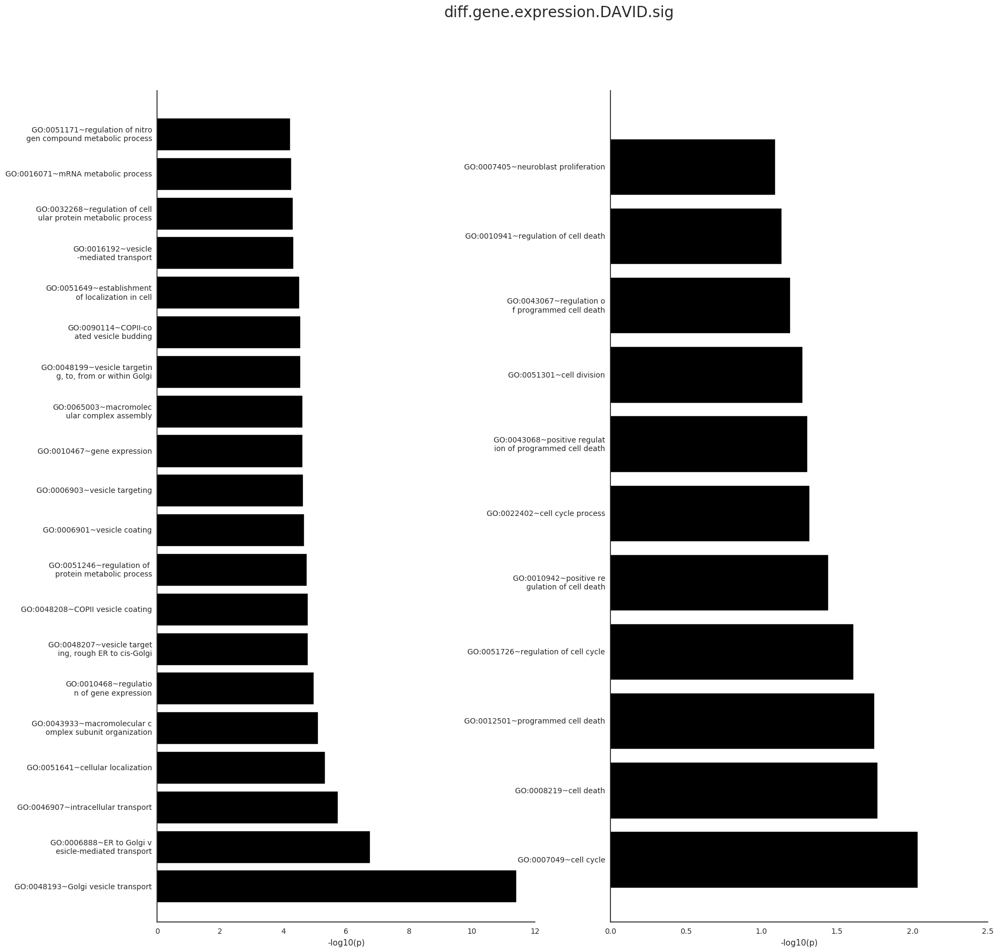

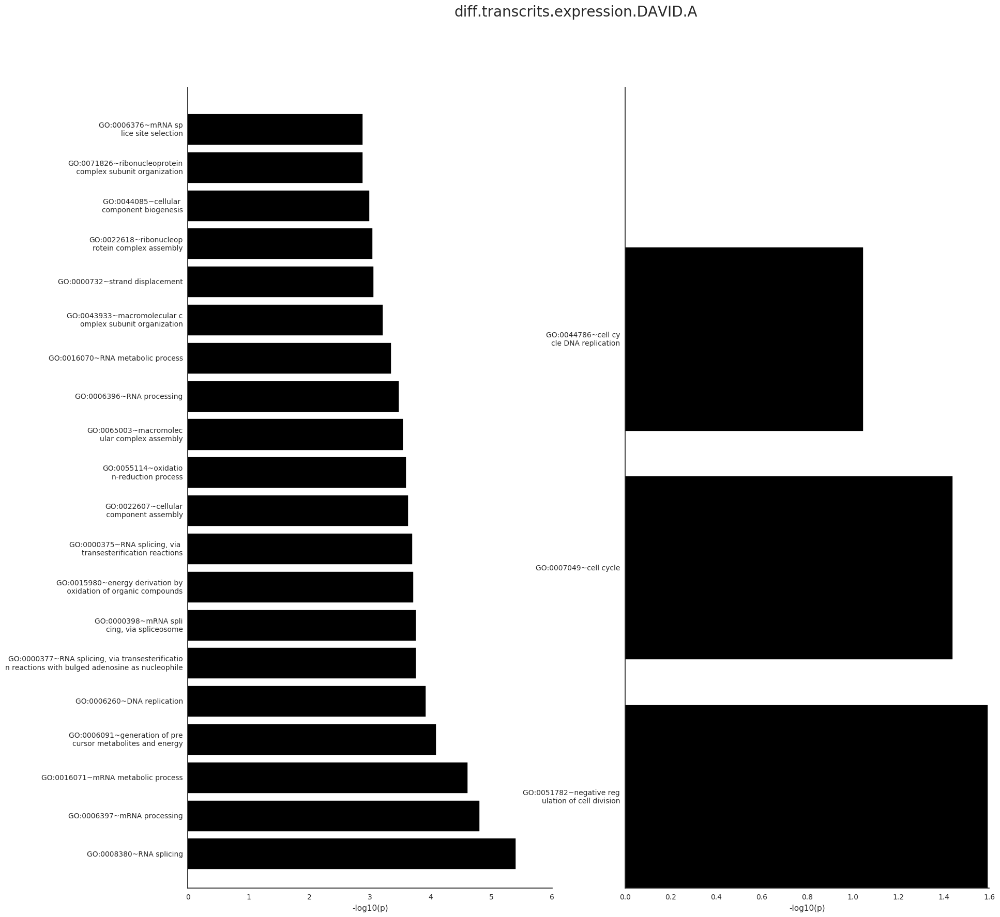

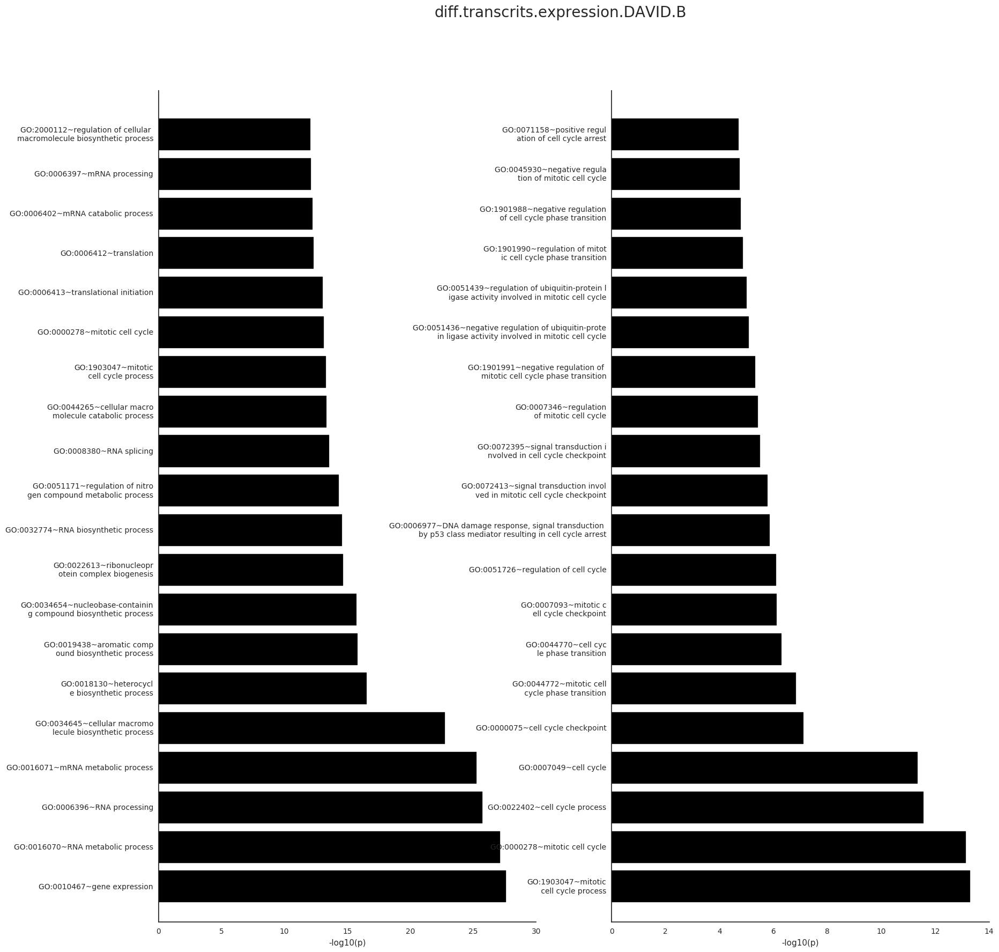

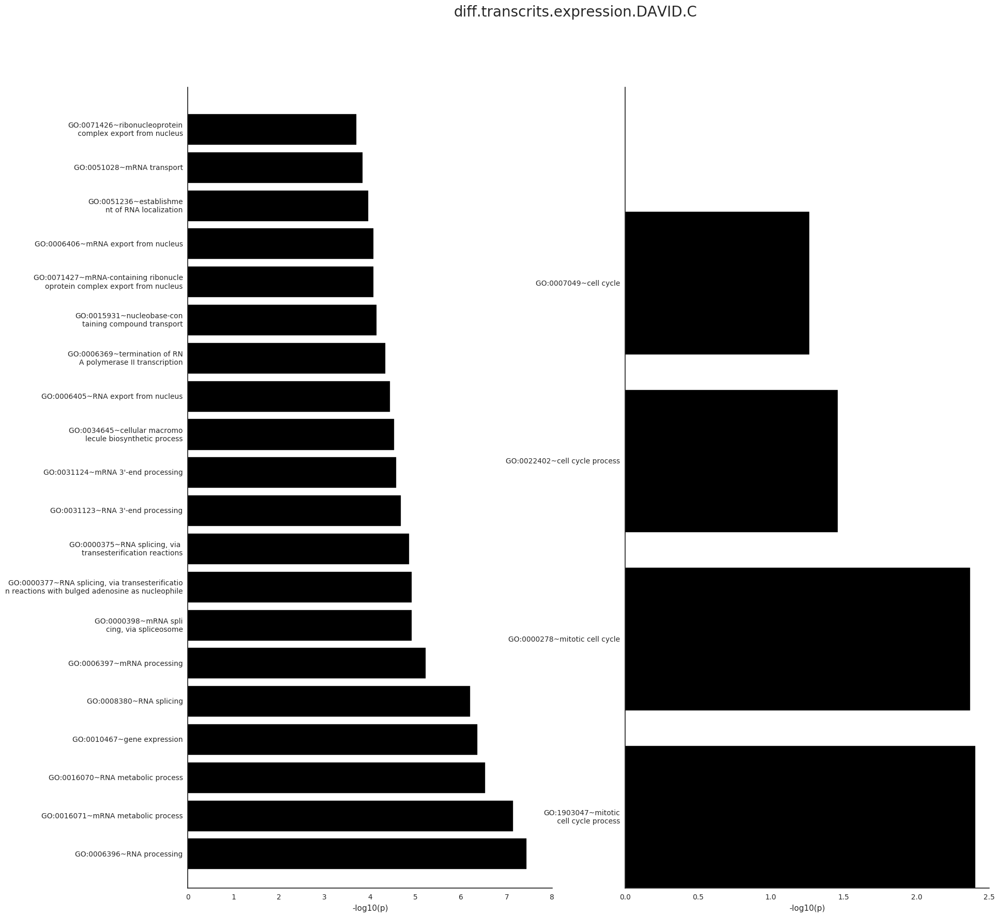

diff.transcrits.expression.DAVID.D.xlsx
diff.transcrits.expression.DAVID.E.xlsx


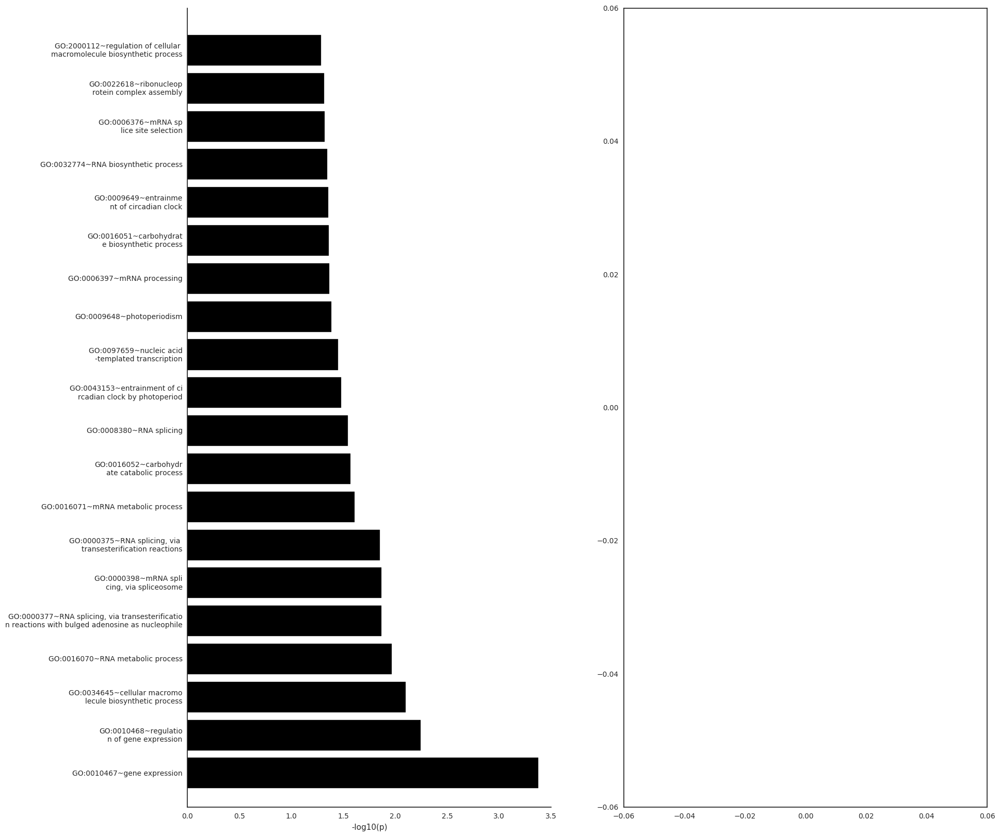

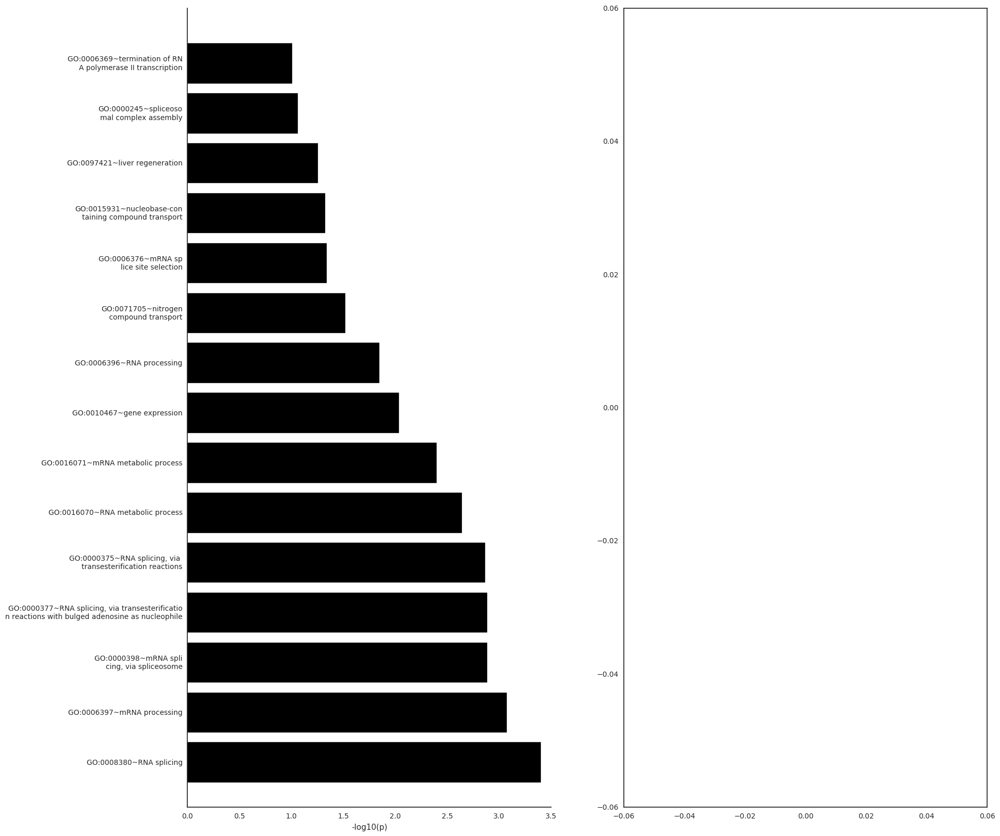

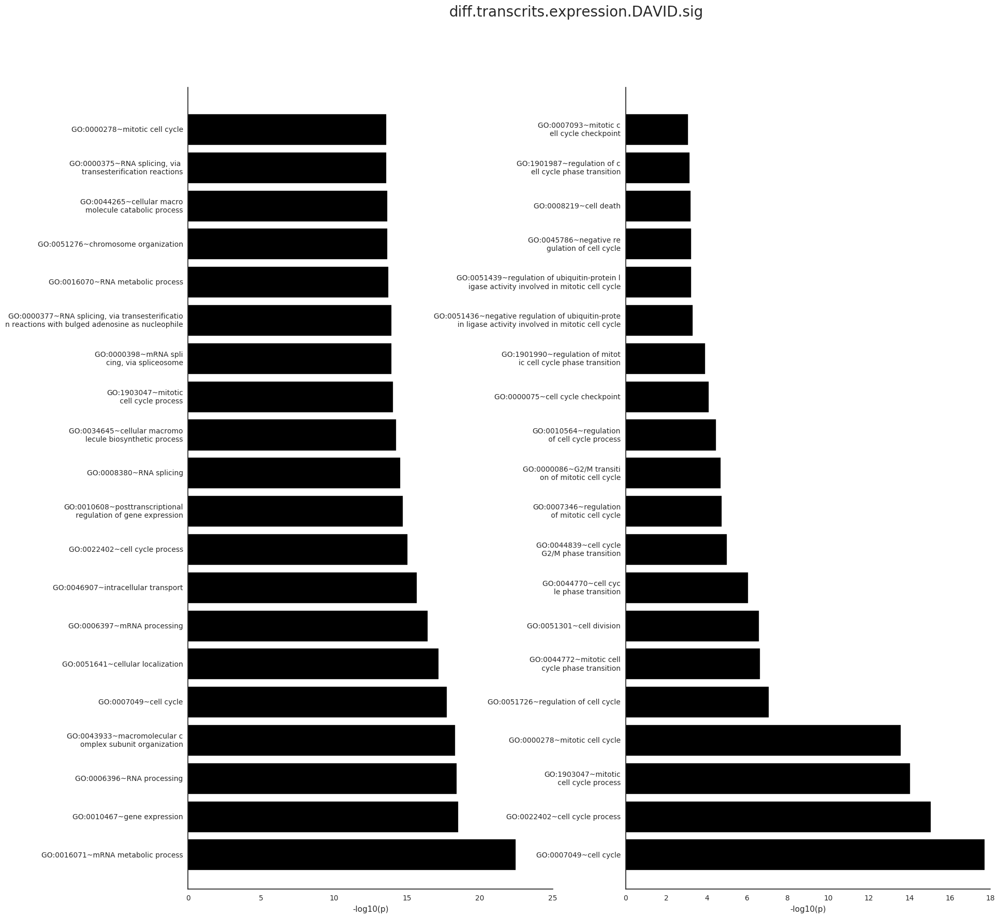

target.genes.DAVID.A.xlsx


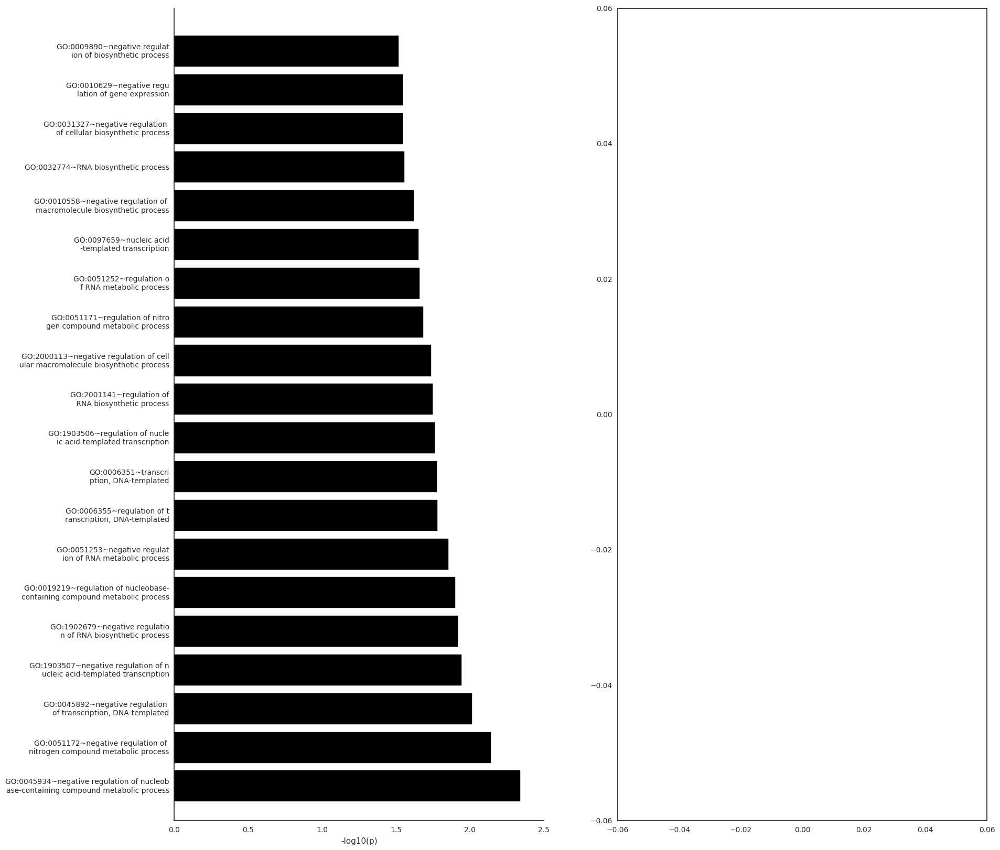

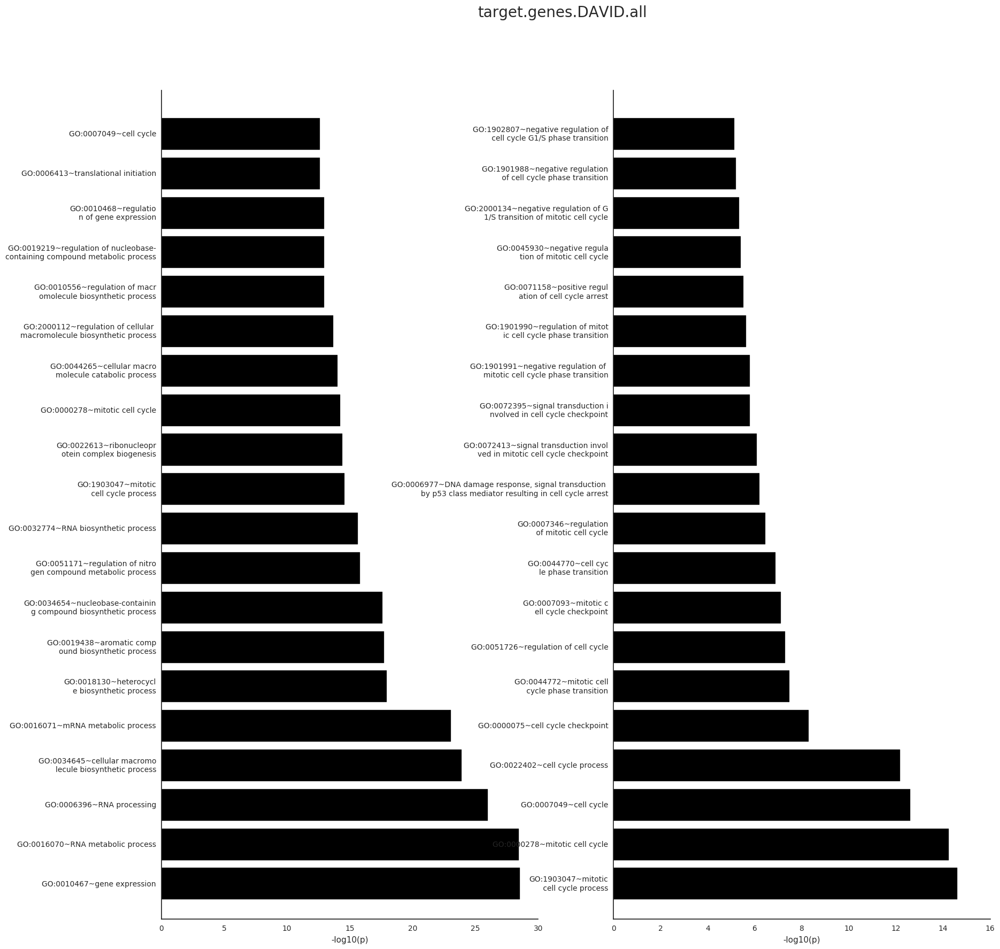

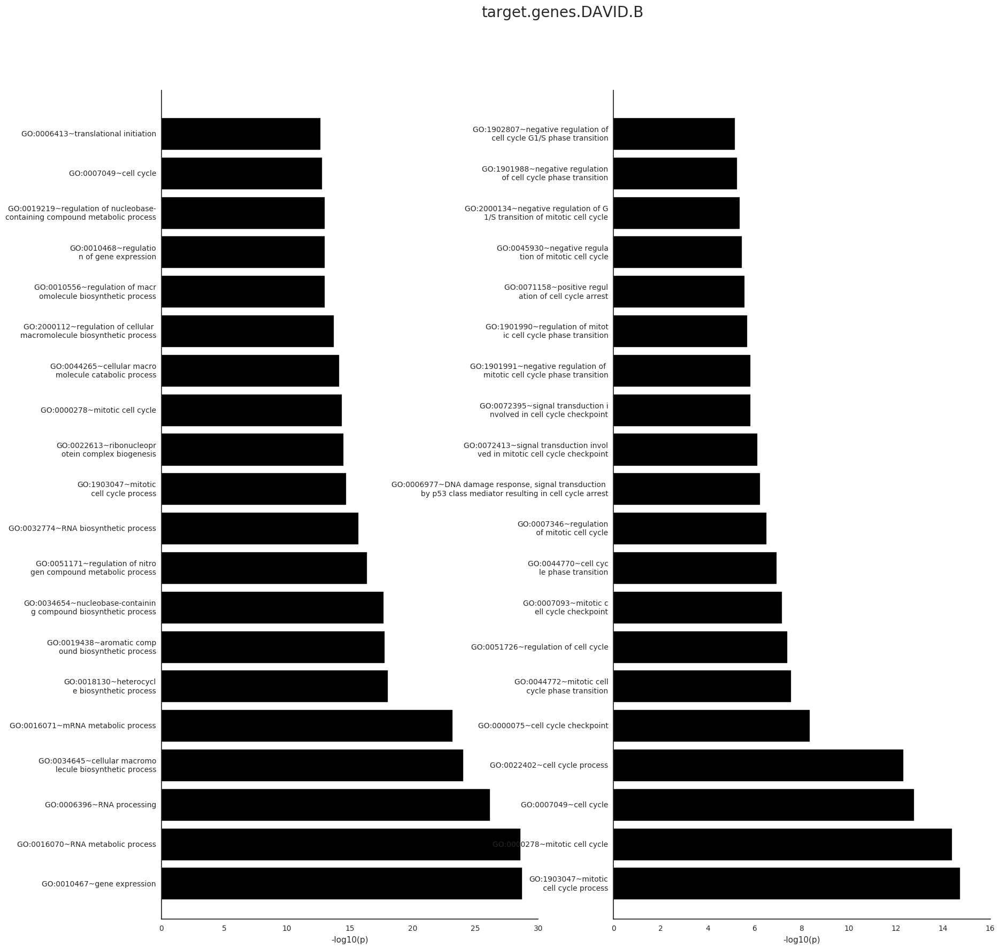

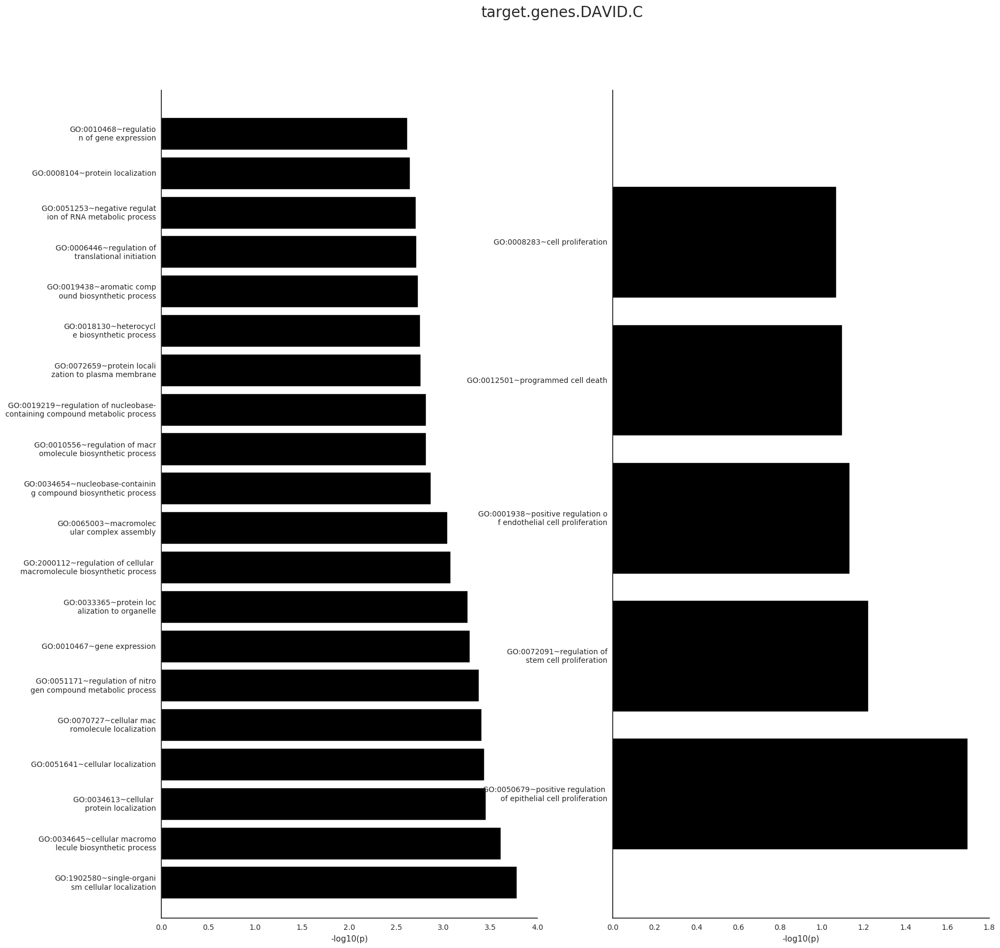

target.genes.DAVID.D.xlsx


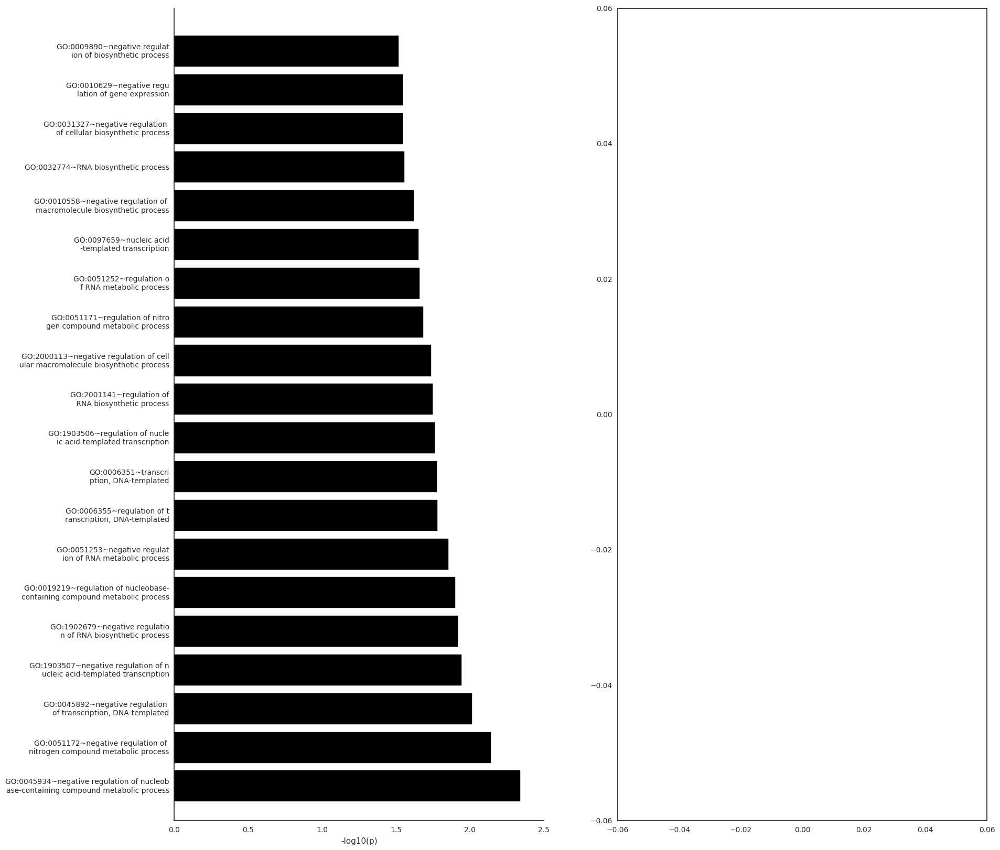

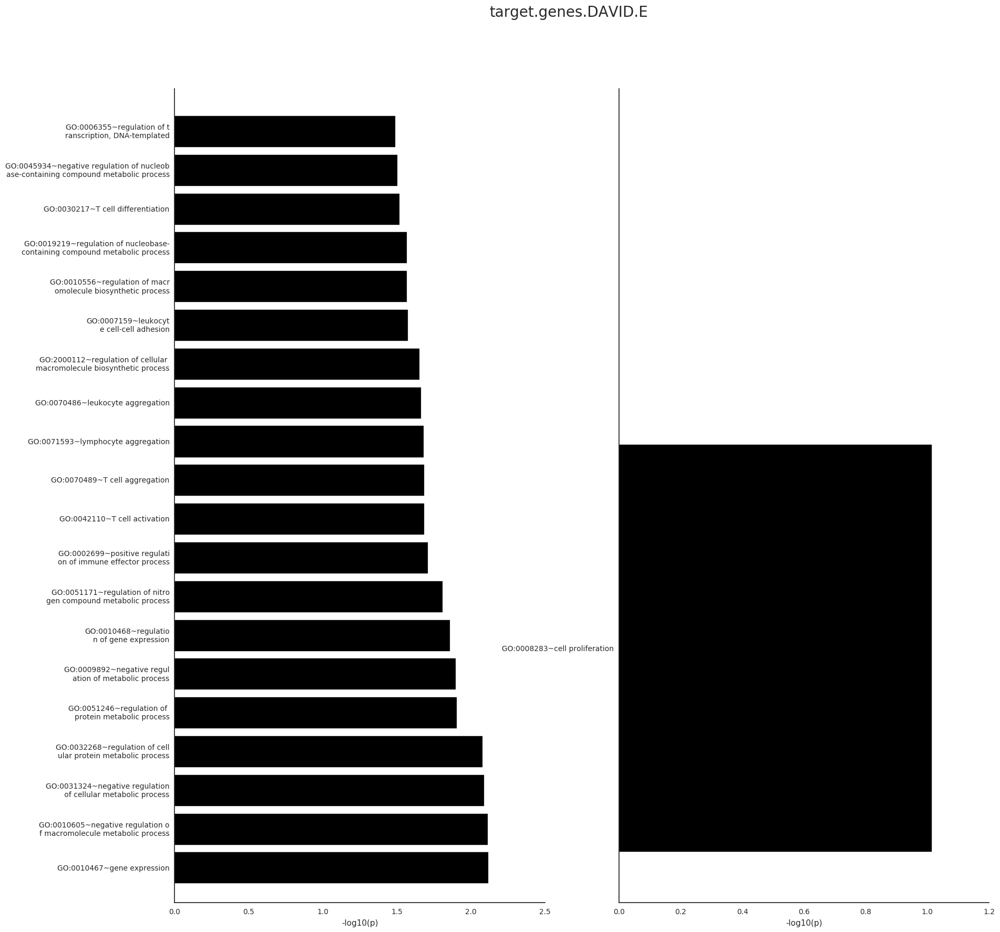

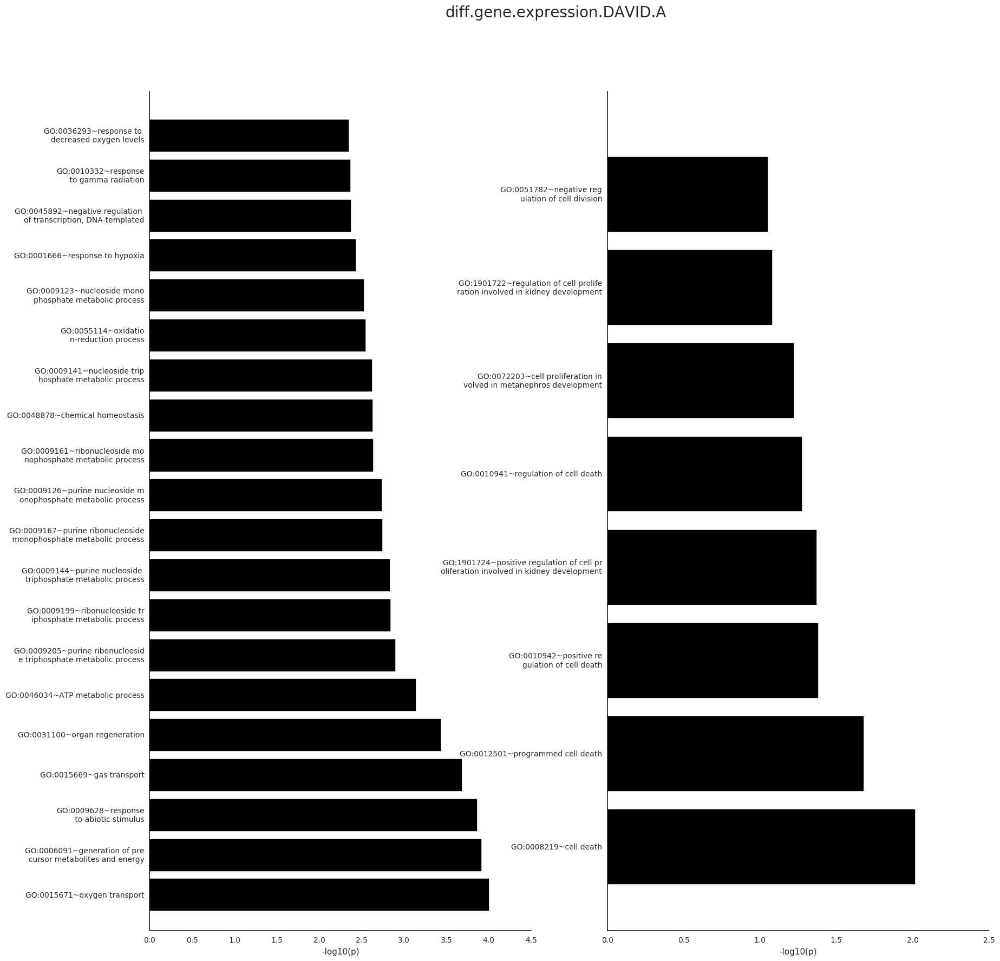

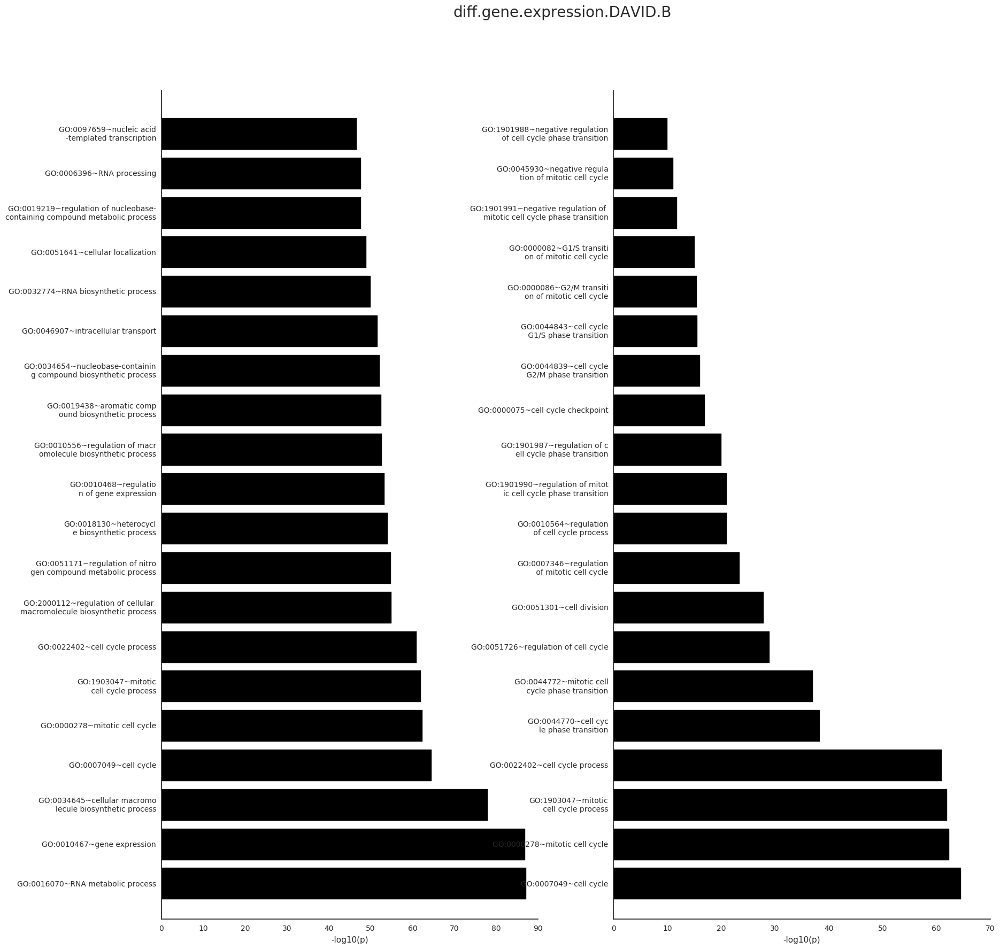

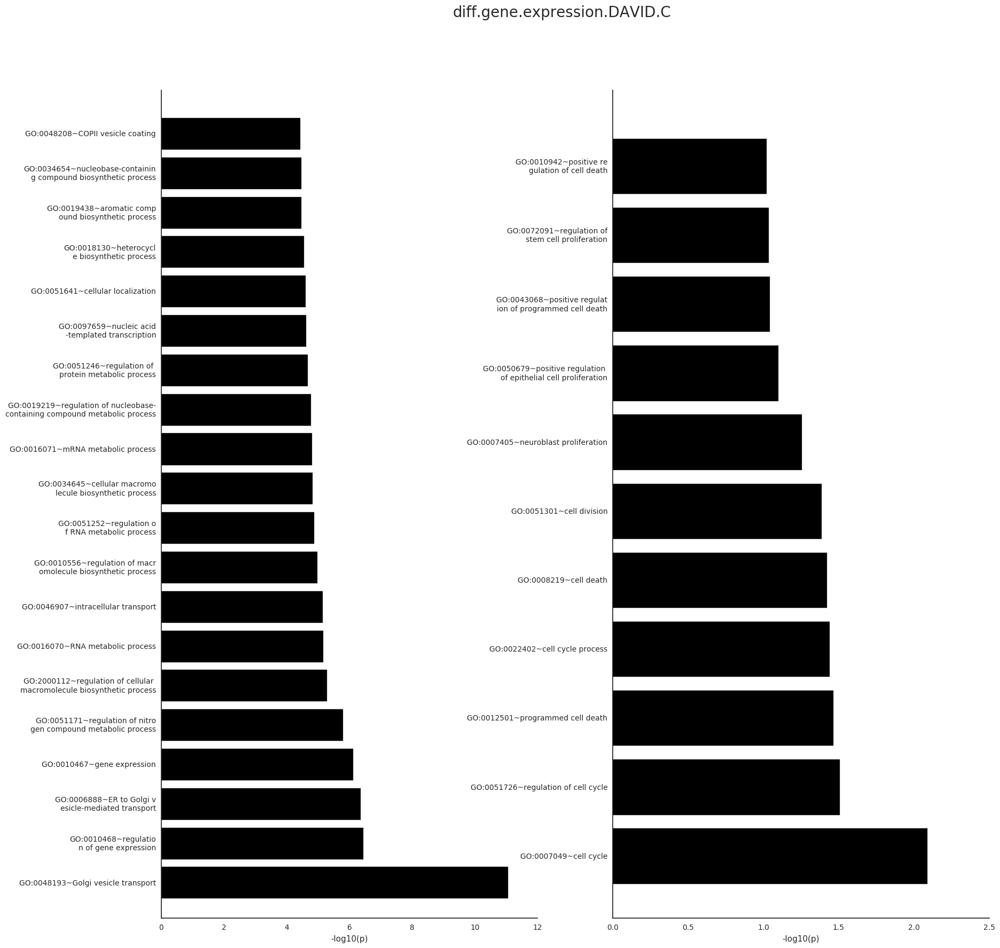

...

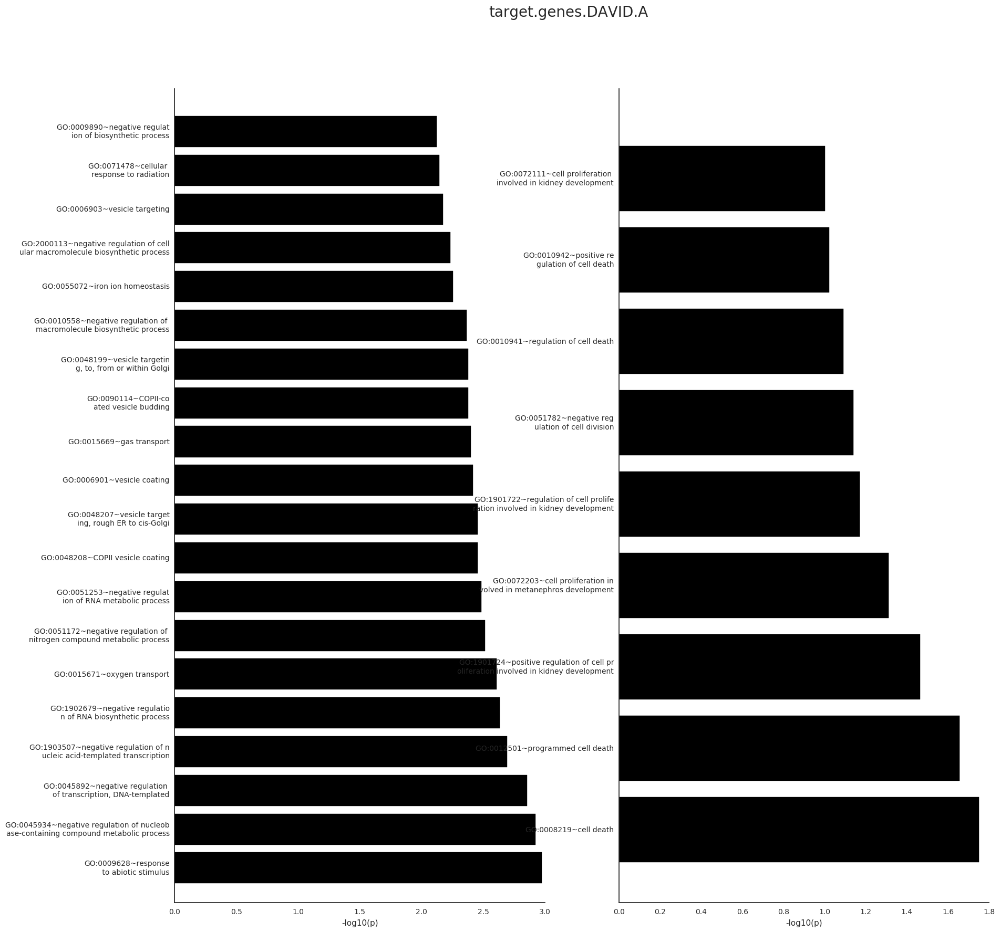

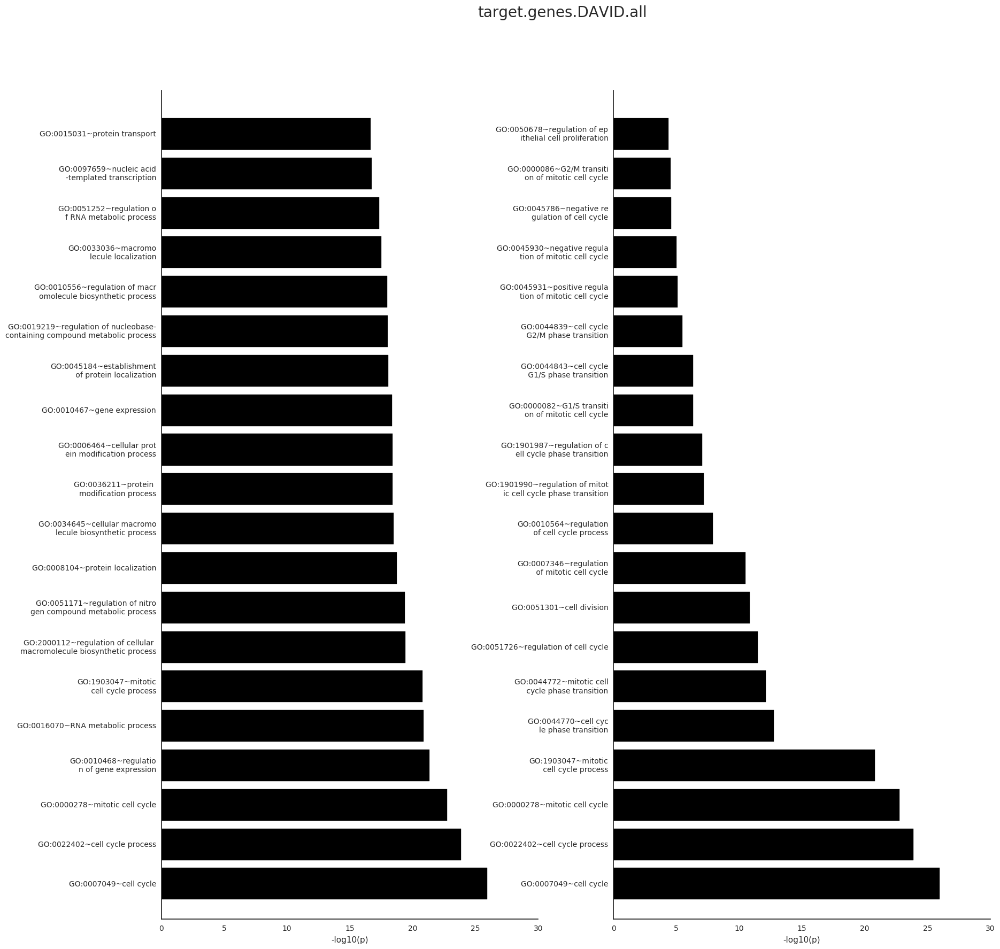

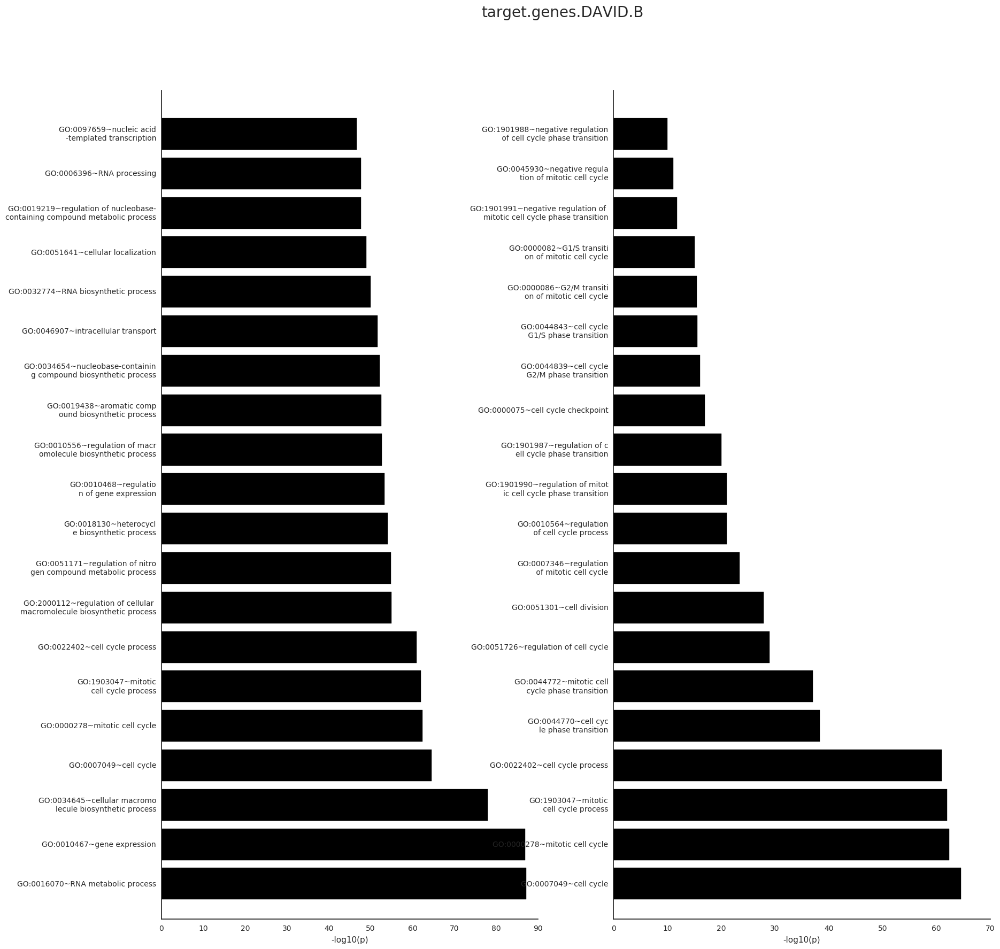

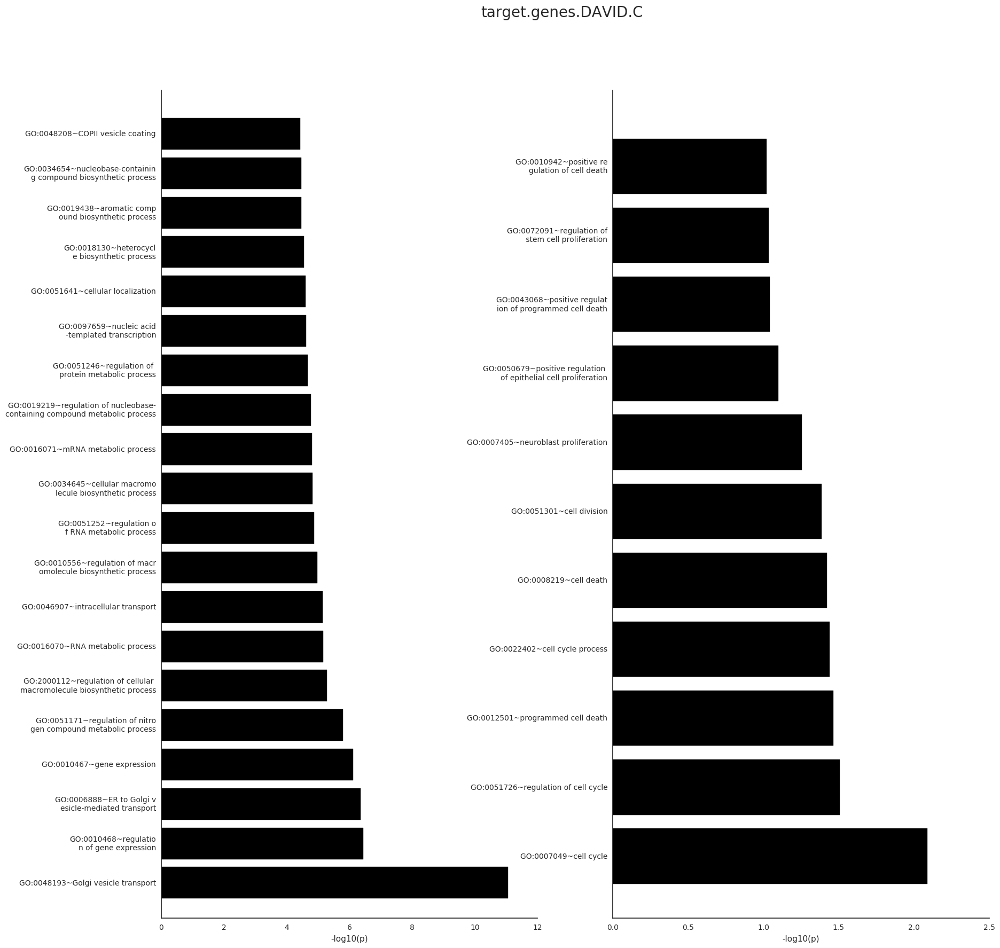

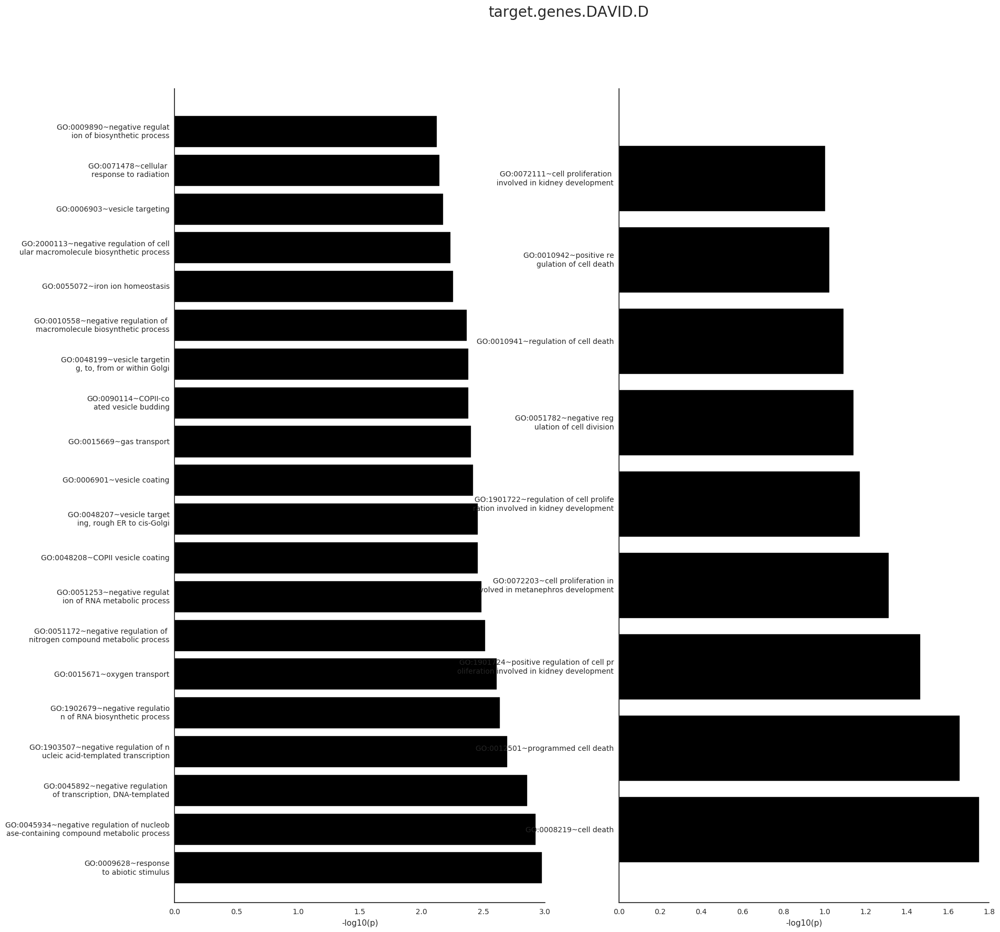

In [69]:
print datetime.now()
def EnrPlots(df,title,figName,stringsOFinterest=["cell cycle","apoptosis","cell death","cell division","proliferation"]):
    df_=df.copy()
    df_["-log10(p)"]=df_["ease"].apply( lambda x: -1*np.log10(x) )
    dfA=df_[:20]
    all_terms=df_["termName"].tolist()
    filteredTerms=[]
    for s in all_terms:
        tt=[ i for i in stringsOFinterest if i in s ]
        if len(tt)>0:
            filteredTerms.append(s)
    dfB=df_[df_["termName"].isin(filteredTerms)]
    dfB=dfB[:20]
    
    fig = plt.figure(figsize=(20,20))
    for i,dd in zip([1,2],[dfA,dfB]):
        ax1 = fig.add_subplot(1,2,i)
        arr=np.arange(len(dd))+.5

        ax1.barh(arr, dd["-log10(p)"].tolist(), color='black', edgecolor='black')#range(0,len(test))

        ax1.tick_params(
            axis='y',
            which='both',
            left='off',
            right='off',
            labelleft='on')

        ax1.tick_params(
            axis='x',
            which='both',
            bottom='on',
            top='off',
            labelbottom='on',
            labeltop='off')

        ax1.set_ylim(ymax = max(arr) + 1.5 ) #1.5
        ax1.set_xlabel("-log10(p)")
        ax1.xaxis.set_label_position('bottom')

        ax1.spines['right'].set_visible(False)
        ax1.spines['top'].set_visible(False)
        
        labels=[]
        for l in dd["termName"].tolist():
            if len(l)>35:
                res=l[:len(l)/2]+"\n"+l[len(l)/2:]
            else:
                res=l
            labels.append(res)
        
        ax1.set_yticks(arr+0.4)
        ax1.set_yticklabels(labels)
        
    fig.suptitle(title, fontsize=20)
    plt.savefig(figName+".png",dpi=300,bbox_inches='tight', pad_inches=0.1,format='png')
    plt.savefig(figName+".svg",dpi=300,bbox_inches='tight', pad_inches=0.1,format='svg')
    plt.show()


DAVIDfiles=os.listdir(outFolder)
DAVIDfiles=[ s for s in DAVIDfiles if "DAVID" in s ]

DAVIDfiles_=os.listdir(FIMO_OUT)
DAVIDfiles_=[ s for s in DAVIDfiles_ if "DAVID" in s ]

for f in DAVIDfiles:
    try:
        df=pd.read_excel(outFolder+f,"GOTERM_BP_FAT")
        EnrPlots(df,f.split(".xlsx")[0],outFigures+f.split(".xlsx")[0],)
    except:
        print f

for f in DAVIDfiles_:
    try:
        df=pd.read_excel(FIMO_OUT+f,"GOTERM_BP_FAT")
        EnrPlots(df,f.split(".xlsx")[0],FIMO_OUT+f.split(".xlsx")[0])
    except:
        print f


In [70]:
print datetime.now()

2016-10-29 16:33:34.440869
